In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3
import statsmodels.api as sm
import os
import sweetviz as sv
import plotly.express as px
import scipy.stats as stats

from sklearn.inspection import permutation_importance
from selenium.webdriver.chrome.service import Service
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report, roc_auc_score


import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)

In [2]:
chromedriver_path = "./chromedriver.exe" 

service = Service(executable_path=chromedriver_path)


notebook_dir = os.getcwd()

# Construye la ruta completa al archivo SQLite
sqlite_path = os.path.join(notebook_dir, 'NBA_DATABASE.sqlite')

# Conecta SQLite usando la ruta dinámica
conn = sqlite3.connect(sqlite_path)
cursor = conn.cursor()

### Declaración de variables principales

In [3]:
# Creamos los Dataframes con las tablas de la base de datos
game_info = pd.read_sql_query("SELECT * FROM game_info", conn)
team_stats = pd.read_sql_query("SELECT * FROM team_stats", conn)
player_stats = pd.read_sql_query("SELECT * FROM player_stats", conn)

# Creamos los Dataframes a base de los csv con los datos ya preparados
player_full_10 = pd.read_csv("./Data/players_full_10.csv")
player_full_20 = pd.read_csv("./Data/players_full_20.csv")
player_full_30 = pd.read_csv("./Data/players_full_30.csv")

# Listas que nos servirán en los posteriores análisis
dataframe_list = [player_full_10, player_full_20, player_full_30]
df_names = ['player_full_10', 'player_full_20', 'player_full_30']
non_imput_columns = ['result', 'game_id', 'season', 'date', 'away_team', 'away_score', 'home_team', 'home_score']

# Creación de Dataframe auxiliar para almacenar las métricas conseguidas en el modelado
iqr_df = pd.DataFrame(columns=['Variable', 'Valores fuera de rango', 'Porcentaje fuera de rango'])

if os.path.isfile("results.csv"):
    results_df = pd.read_csv("results.csv")
else:
    results_df = pd.DataFrame(columns=['model_name','Train Score', 'Test Score', 'CV Score', 'CV Score Std'])


### Funciones

In [6]:
# Función para dibujar los histogramas de nuestro dataframe
def histogram_boxplot(data, xlabel = None, title = None, font_scale=2, figsize=(9,8), bins = None):
    sns.set(font_scale=font_scale)
    f2, (ax_box2, ax_hist2) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=figsize)
    sns.boxplot(x=data, ax=ax_box2)
    sns.histplot(x=data, ax=ax_hist2, bins=bins) if bins else sns.histplot(x=data, ax=ax_hist2)
    ax_hist2.axvline(np.mean(data),color='g',linestyle='-')
    ax_hist2.axvline(np.median(data),color='y',linestyle='--')
    if xlabel: ax_hist2.set(xlabel=xlabel)
    if title: ax_box2.set(title=title, xlabel="")
    plt.show()

# Función para detectar outliers según los rangos iqr
def valores_fuera_rango(variable_numerica, nombre_variable, df_resultados):
    """
    Calcula el número y porcentaje de valores fuera del rango intercuartílico (IQR)
    en una serie de datos numéricos y almacena los resultados en un DataFrame.

    Parámetros:
    - variable_numerica: Pandas Series que contiene los datos numéricos a evaluar.
    - nombre_variable: Nombre de la variable para almacenar en el DataFrame de resultados.
    - df_resultados: DataFrame donde se almacenarán los resultados.

    Retorna:
    - df_resultados actualizado con el número y porcentaje de valores fuera del rango para la variable.
    """
    # Calcular el resumen estadístico de la variable
    resumen = variable_numerica.describe()
    q1 = resumen['25%']
    q3 = resumen['75%']
    iqr = q3 - q1

    # Calcular los límites inferior y superior
    valor_minimo = q1 - (1.5 * iqr)
    valor_maximo = q3 + (1.5 * iqr)
    
    # Identificar valores fuera de los límites
    valores_filtrados = variable_numerica[(variable_numerica < valor_minimo) | (variable_numerica > valor_maximo)]
    
    # Calcular el número y porcentaje de valores filtrados
    numero_filtrados = len(valores_filtrados)
    porcentaje_filtrados = (numero_filtrados / len(variable_numerica)) * 100
    
    # Almacenar los resultados en el DataFrame
    df_resultados = df_resultados.append({
        'Variable': nombre_variable,
        'Valores fuera de rango': numero_filtrados,
        'Porcentaje fuera de rango': porcentaje_filtrados
    }, ignore_index=True)
    
    return df_resultados
# Función para eliminar los outliers
def remove_outliers_iqr(df, columns):
    """
    Elimina los outliers de las columnas especificadas usando el método IQR.

    Parameters:
    df : pd.DataFrame
        El DataFrame que contiene las columnas a procesar.
    columns : list of str
        Lista de nombres de columnas de las cuales eliminar los outliers.

    Returns:
    pd.DataFrame
        DataFrame filtrado con los outliers eliminados.
    """
    for column in columns:
        # Calcular los cuartiles y el rango intercuartil (IQR) para la columna actual
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1
        
        # Definir los límites inferior y superior
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Imprimir los límites para verificar
        print(f"Processing column: {column}")
        print(f"Lower bound: {lower_bound}, Upper bound: {upper_bound}")

        # Filtrar los datos dentro de los límites para la columna actual
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
        
        # Imprimir la cantidad de registros después del filtrado
        print(f"Number of records after filtering {column}: {len(df)}")

    return df

# Función para calcular V de Cramer
def cramers_v(var1, varObj):
    
    # Convertir a categórico si no es ya categórico
    if not pd.api.types.is_categorical_dtype(var1):
        if pd.api.types.is_numeric_dtype(var1):  # Si es numérico, cortamos en bins
            bins = min(5, var1.nunique())
            var1 = pd.cut(var1, bins=bins)
        else:  # Si es de tipo string o mixto, lo convertimos a categoría
            var1 = var1.astype('category')
    
    if not pd.api.types.is_categorical_dtype(varObj):
        if pd.api.types.is_numeric_dtype(varObj):
            bins = min(5, varObj.nunique())
            varObj = pd.cut(varObj, bins=bins)
        else:
            varObj = varObj.astype('category')

    # Crear la tabla de contingencia
    data = pd.crosstab(var1, varObj).values

    # Calcular el V de Cramer usando scipy
    vCramer = stats.contingency.association(data, method='cramer')
    
    return vCramer

# Definición de funciones para comprobar las diferentes métricas
def calcular_metricas(model, X_train, X_test, y_train, y_test, resultados_df, name_model, cv=5):
    """
    Calcula los scores del modelo en train, test, y mediante cross validation,
    almacena los resultados en el DataFrame proporcionado y los imprime.
    
    Parámetros:
    - model: Modelo a evaluar.
    - X_train, X_test, y_train, y_test: Datos de entrenamiento y prueba.
    - resultados_df: DataFrame donde se almacenarán los resultados.
    - cv: Número de folds para la validación cruzada.
    """

    # Nombre del modelo
    model_name = name_model

    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predicciones
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Scores de train y test
    train_score = model.score(X_train, y_train)
    test_score = model.score(X_test, y_test)
    
    # Validación cruzada
    cv_scores = cross_val_score(model, X_train, y_train, cv=cv)
    mean_cv_score = cv_scores.mean()
    
    # Almacenar los resultados en el DataFrame proporcionado
    resultados_df.loc[len(resultados_df)] = {
        'model_name' : model_name,
        'Train Score': train_score,
        'Test Score': test_score,
        'CV Score': mean_cv_score,
        'CV Score Std': cv_scores.std()
    }
    
    # Imprimir el DataFrame de resultados
    resultados_df.to_csv("results.csv", index=False)
    resultados_df



def metricas_modelo(X_train, y_train, X_test, y_test, y_pred, y_proba, model_multiclass, get_all_roc_coordinates, plot_roc_curve, results_df, name_model):

    plt.figure(figsize=(12, 8))
    
    # Definimos los bines para el histograma
    bins = [i/20 for i in range(20)] + [1]
    
    # Etiquetas de las clases del modelo
    classes = model_multiclass.classes_
    
    # Dictionario para almacenar valores AUC
    roc_auc_ovr = {}
    
    # Loop para cada clase
    for i in range(len(classes)):
        c = classes[i]
        
        # Creamos df auxiliares
        df_aux = X_test.copy()
        df_aux['class'] = [1 if y == c else 0 for y in y_test]
        df_aux['prob'] = y_proba[:, i]
        df_aux = df_aux.reset_index(drop=True)
        
        # Dibujamos la distribución de probabilidad para clase y el resto
        ax = plt.subplot(2, 3, i+1)
        sns.histplot(x="prob", data=df_aux, hue='class', color='b', ax=ax, bins=bins)
        ax.set_title(c)
        ax.legend([f"Class: {c}", "Rest"])
        ax.set_xlabel(f"P(x = {c})")
        
        # Calculamos y dibujamos la curva ROC (One vs Rest)
        ax_bottom = plt.subplot(2, 3, i+4)
        tpr, fpr = get_all_roc_coordinates(df_aux['class'], df_aux['prob'])
        plot_roc_curve(tpr, fpr, scatter=False, ax=ax_bottom)
        ax_bottom.set_title(f"ROC Curve OvR (Class: {c})")
        
        # Calculamos ROC AUC (One vs Rest)
        roc_auc_ovr[c] = roc_auc_score(df_aux['class'], df_aux['prob'])
        ax_bottom.text(0.6, 0.2, f"AUC = {roc_auc_ovr[c]:.2f}", transform=ax_bottom.transAxes)
    
    plt.tight_layout()
    
    # Calculamos la matriz de confusión para cada clase y las diferentes métricas
    conf_matrix = confusion_matrix(y_test, y_pred, labels=classes)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Sacamos las métricas globales
    print("\nMétricas globales:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision (weighted): {precision:.2f}")
    print(f"Recall (weighted): {recall:.2f}")
    print(f"F1-Score (weighted): {f1:.2f}")

    print("\nMatriz de confusión:")
    print(conf_matrix)
    print(f"Accuracy: {accuracy:.4f}")
    
    # Dibujamos la matriz de confusión como un mapa de color
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Matriz de confusión')
    plt.ylabel('Clase real')
    plt.xlabel('Clase predicha')
    plt.show()
    print(classification_report(y_test, y_pred))
    
    calcular_metricas(model_multiclass, X_train, X_test, y_train, y_test, results_df, name_model=name_model)
    #return roc_auc_ovr, conf_matrix, accuracy, precision_dict, recall_dict, f1_dict


def get_all_roc_coordinates(y_true, y_prob):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    return tpr, fpr

def plot_roc_curve(tpr, fpr, scatter=False, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.plot(fpr, tpr, color='blue', label="Curva ROC")
    ax.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax.set_xlabel("Ratio de falso positivo")
    ax.set_ylabel("Ratio de verdadero positivo")
    ax.legend()


# def importancias_modelo(model, X_train):

#     # Dibujamos el gráfico según importancia de cada variable
#     feat_importances = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=["Importance"])
#     feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
#     feat_importances.plot(kind='bar', figsize=(15,12))
#     importancia = model.feature_importances_
#     indices = np.argsort(importancia)[::-1]

#     # Imprimimos el ranking de importancia de variables
#     print("Ranking de variables:")

#     for f in range(X_train.shape[1]):
#         print("%d. Variable %s (%f)" % (f + 1, X_train.columns[indices[f]], importancia[indices[f]]))

def importancias_modelo(model, X_train, y_train):
    # Inicializar la importancia de características
    importancia = None

    # Verificar si el modelo tiene 'feature_importances_'
    if hasattr(model, 'feature_importances_'):
        importancia = model.feature_importances_
    # Verificar si el modelo tiene 'coef_'
    elif hasattr(model, 'coef_'):
        importancia = np.abs(model.coef_).flatten()
    # Si no tiene 'feature_importances_' ni 'coef_', usamos 'permutation_importance'
    else:
        print("Calculando importancia de características usando Permutation Importance...")
        result = permutation_importance(model, X_train, y_train, n_repeats=5, random_state=42, n_jobs=-1)
        importancia = result.importances_mean

    # Crear un DataFrame con las importancias de las características
    feat_importances = pd.DataFrame(importancia, index=X_train.columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=False, inplace=True)

    # Dibujar el gráfico según la importancia de cada variable
    feat_importances.plot(kind='bar', figsize=(15, 12))
    plt.title("Importancia de las características")
    plt.show()

    # Imprimir el ranking de importancia de variables
    print("Ranking de variables:")
    for i, (col, imp) in enumerate(feat_importances.iterrows()):
        print(f"{i + 1}. Variable {col} ({imp['Importance']})")

In [6]:
player_full_10.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17473 entries, 0 to 17472
Data columns (total 56 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   game_id     17473 non-null  int64  
 1   season      17473 non-null  int64  
 2   date        17473 non-null  object 
 3   away_team   17473 non-null  object 
 4   away_score  17473 non-null  int64  
 5   home_team   17473 non-null  object 
 6   home_score  17473 non-null  int64  
 7   result      17473 non-null  int64  
 8   a_FG        17473 non-null  float64
 9   a_FGA       17473 non-null  float64
 10  a_3P        17473 non-null  float64
 11  a_3PA       17473 non-null  float64
 12  a_FT        17473 non-null  float64
 13  a_FTA       17473 non-null  float64
 14  a_ORB       17473 non-null  float64
 15  a_DRB       17473 non-null  float64
 16  a_TRB       17473 non-null  float64
 17  a_AST       17473 non-null  float64
 18  a_STL       17473 non-null  float64
 19  a_BLK       17473 non-nul

In [7]:
for df in dataframe_list:
    df['date'] = pd.to_datetime(df['date'])

In [7]:
player_full_10.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17473 entries, 0 to 17472
Data columns (total 56 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   game_id     17473 non-null  int64         
 1   season      17473 non-null  int64         
 2   date        17473 non-null  datetime64[ns]
 3   away_team   17473 non-null  object        
 4   away_score  17473 non-null  int64         
 5   home_team   17473 non-null  object        
 6   home_score  17473 non-null  int64         
 7   result      17473 non-null  int64         
 8   a_FG        17473 non-null  float64       
 9   a_FGA       17473 non-null  float64       
 10  a_3P        17473 non-null  float64       
 11  a_3PA       17473 non-null  float64       
 12  a_FT        17473 non-null  float64       
 13  a_FTA       17473 non-null  float64       
 14  a_ORB       17473 non-null  float64       
 15  a_DRB       17473 non-null  float64       
 16  a_TRB       17473 non-

                                             |          | [  0%]   00:00 -> (? left)


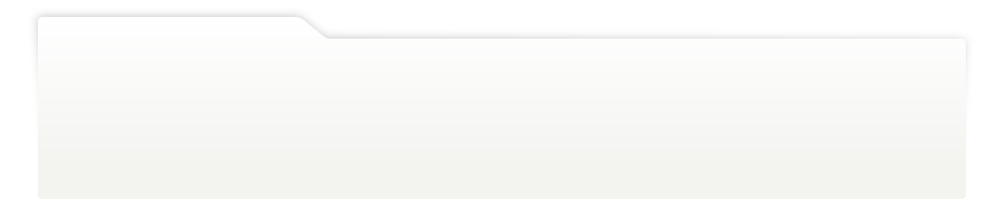
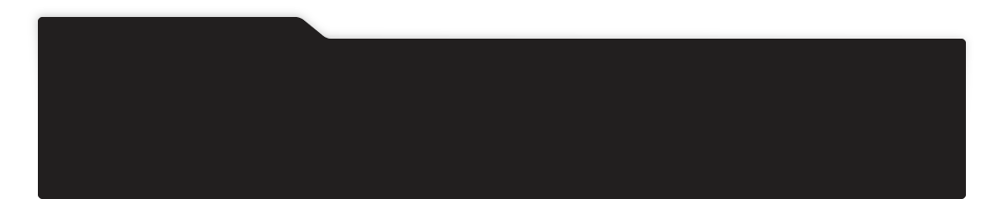
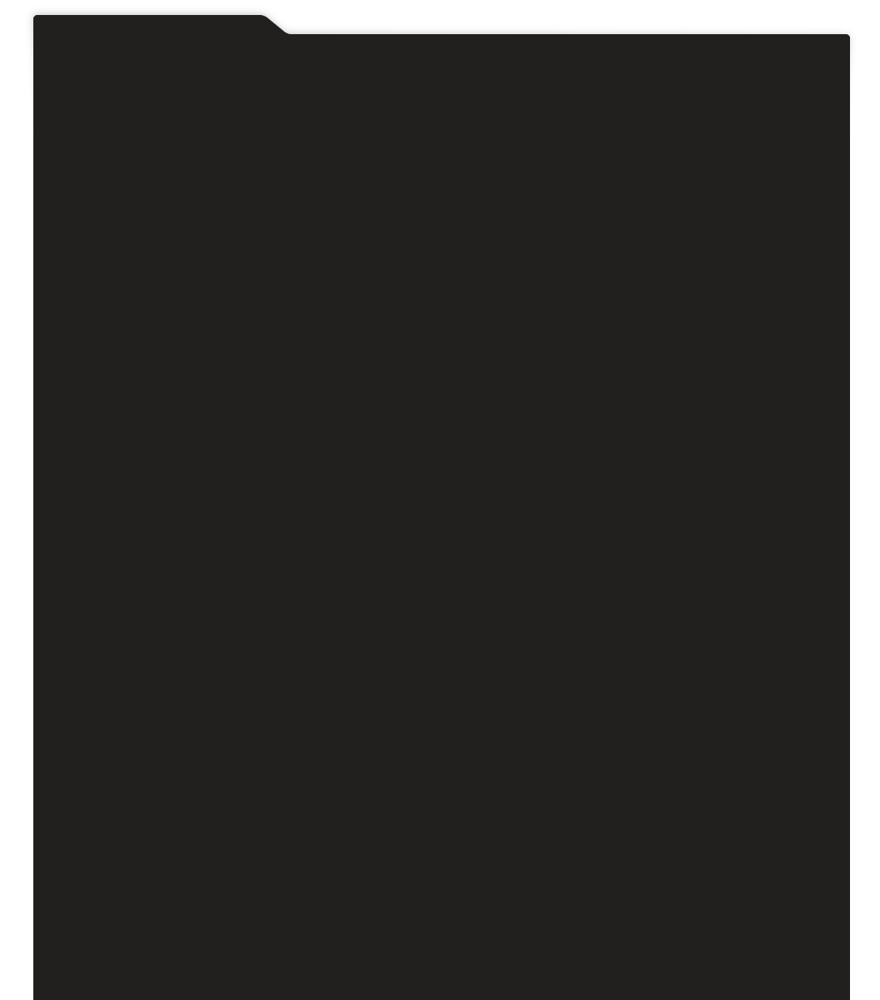
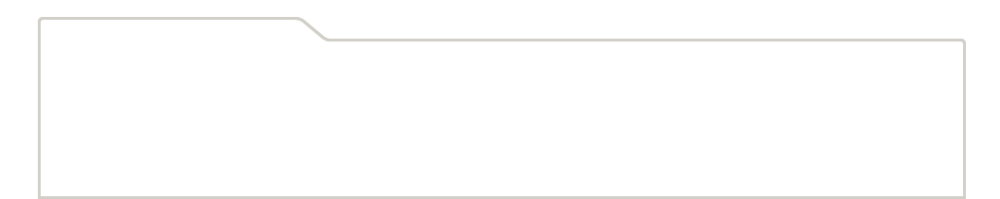
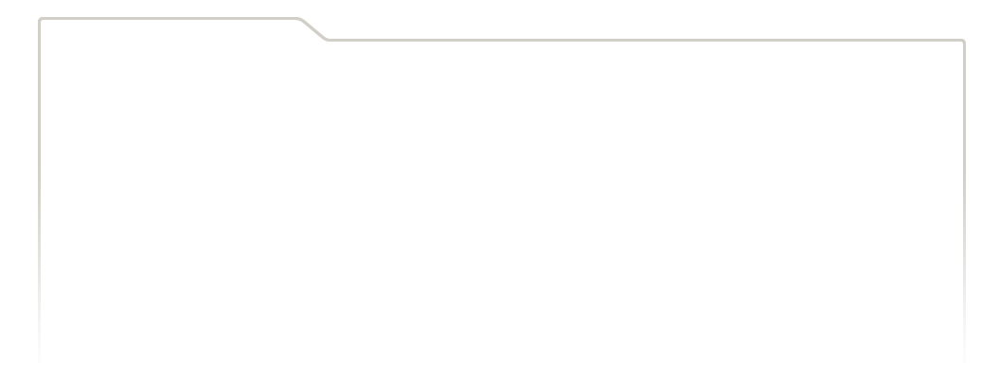
...
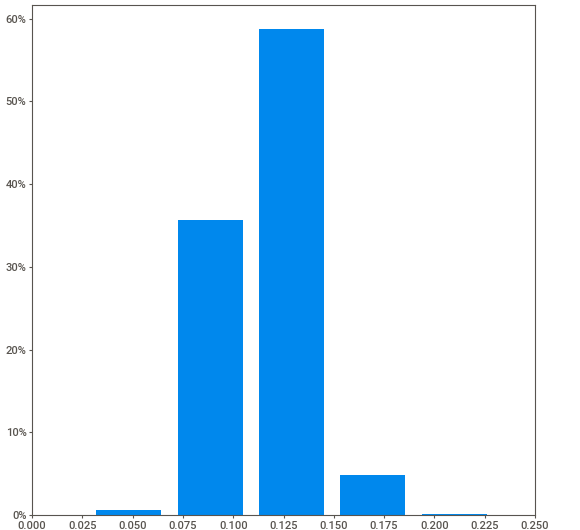
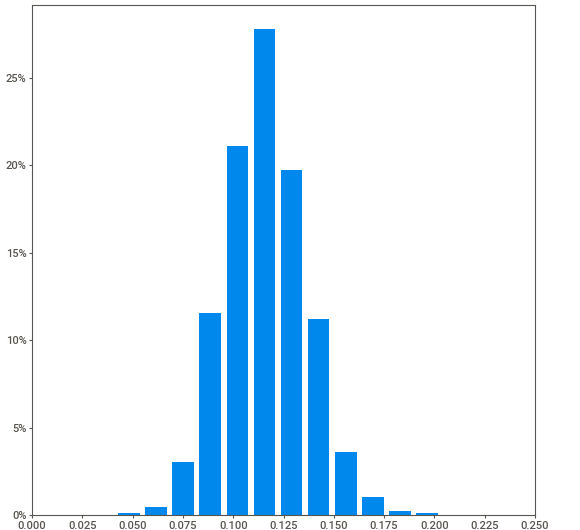
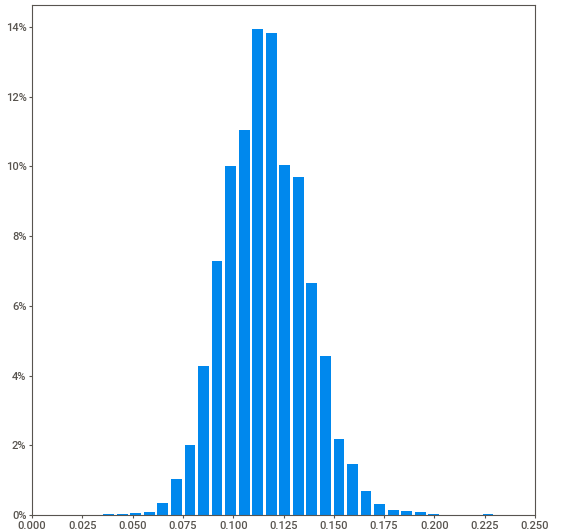
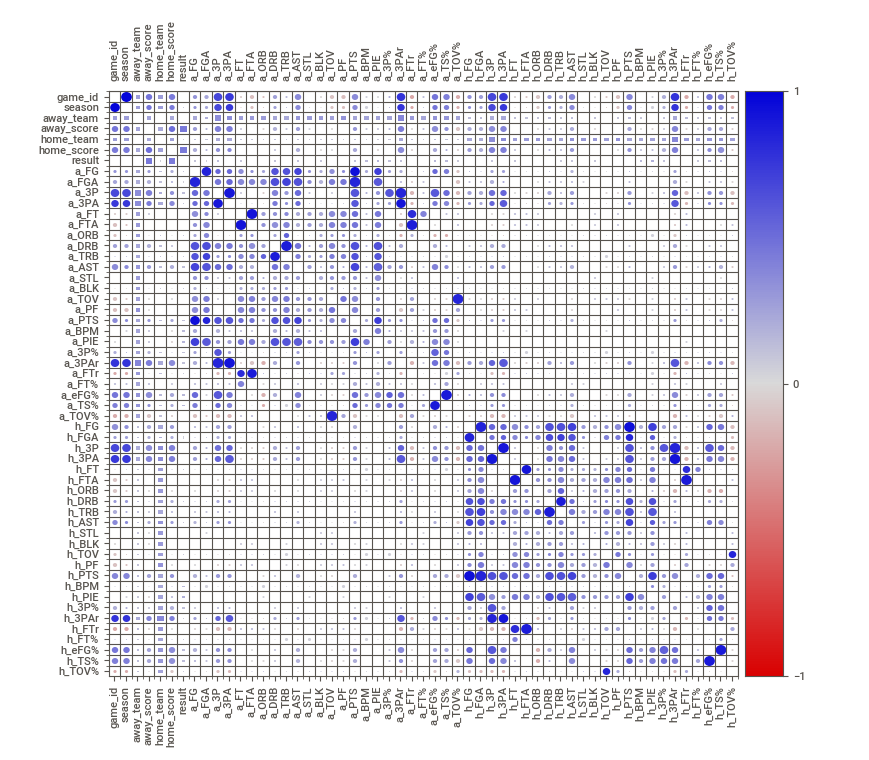
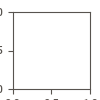

In [8]:
report = sv.analyze(player_full_10)
report.show_notebook(layout="vertical", w=800, h=700, scale=0.8)

In [23]:
player_full_10['result'].value_counts()

1    10092
0     7381
Name: result, dtype: int64

In [24]:
num_cols = player_full_10.select_dtypes(exclude=['object','category', 'datetime']).columns

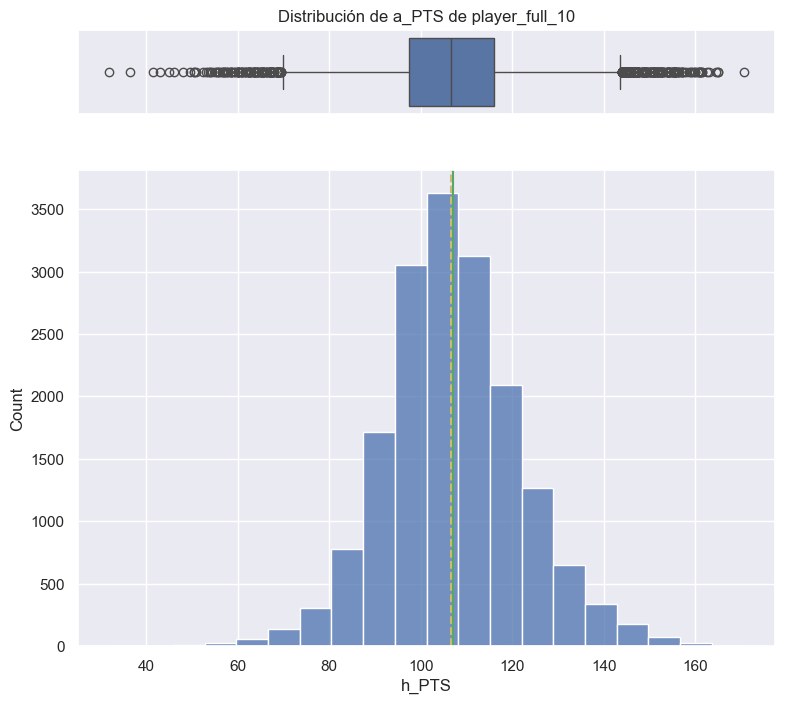

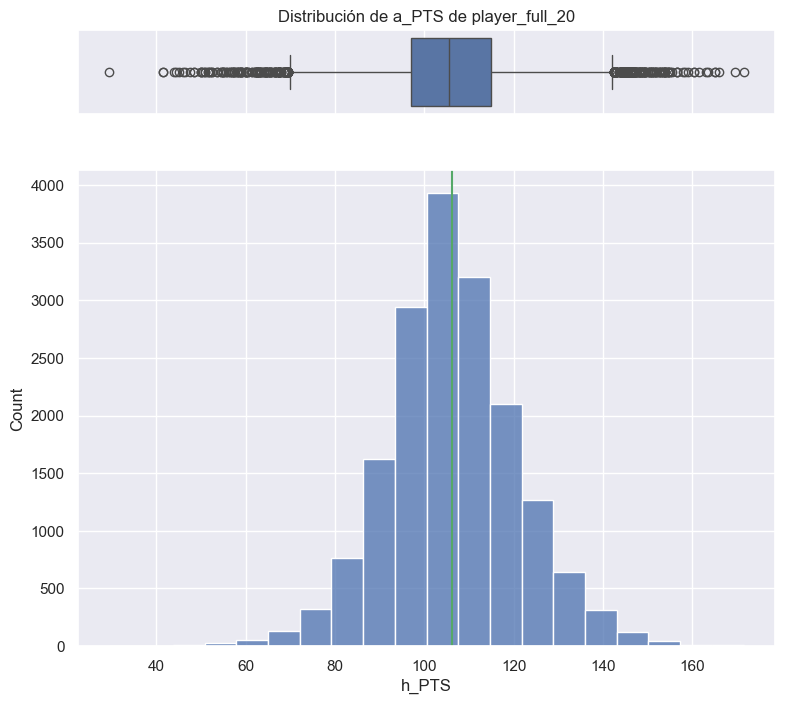

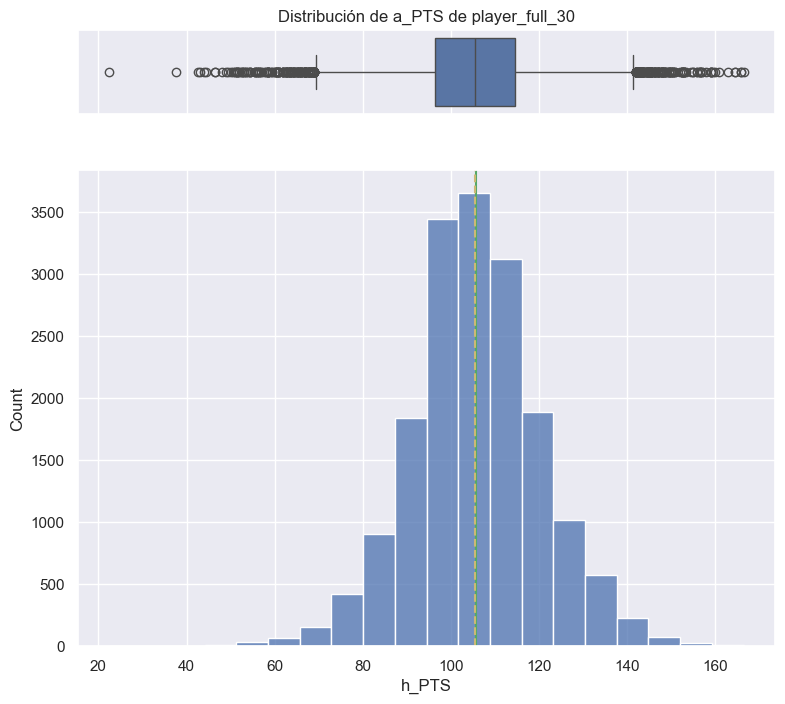

In [88]:
for name, df in zip(df_names, dataframe_list):
    histogram_boxplot(df.h_PTS, bins = 20, font_scale=1, title=f"Distribución de a_PTS de {name}")

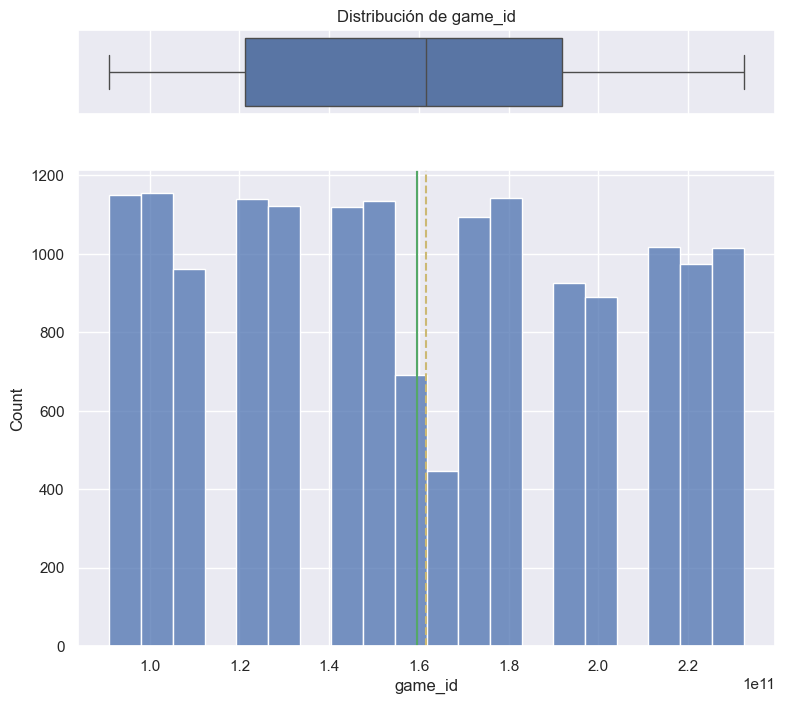

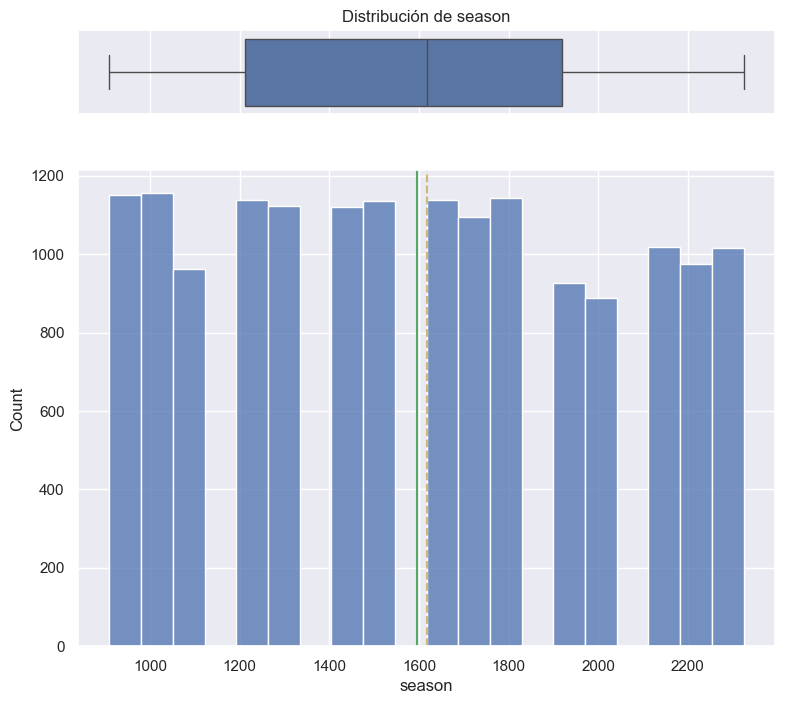

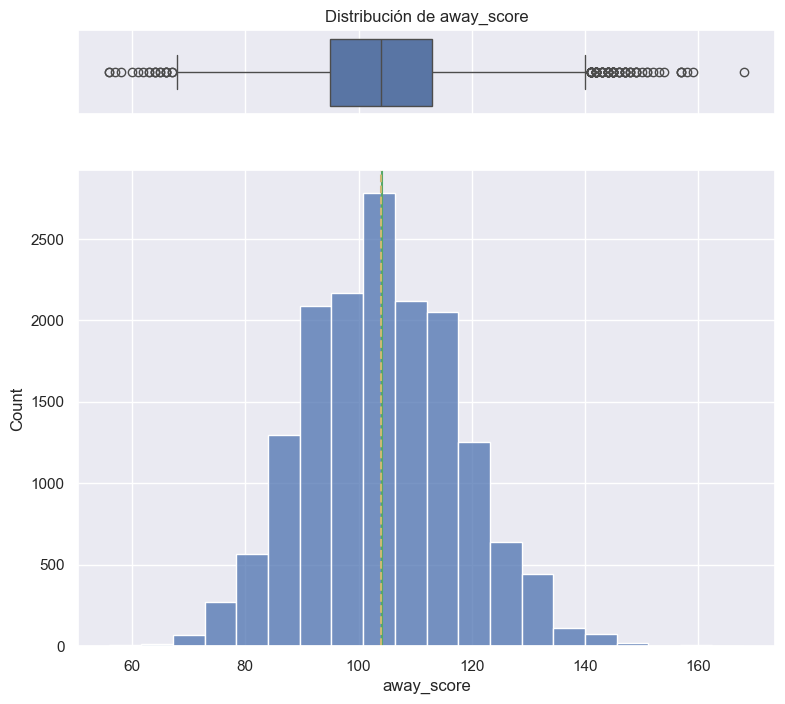

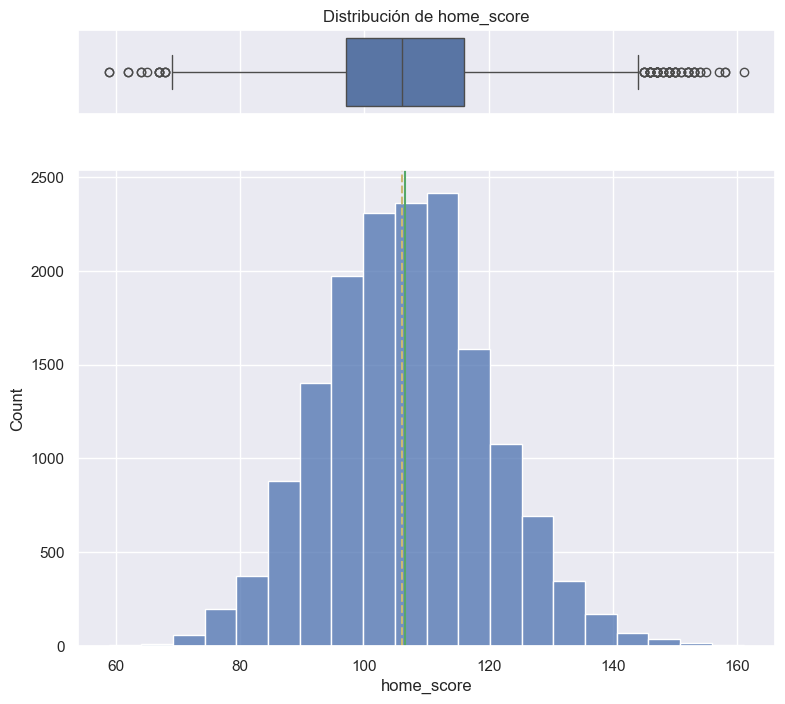

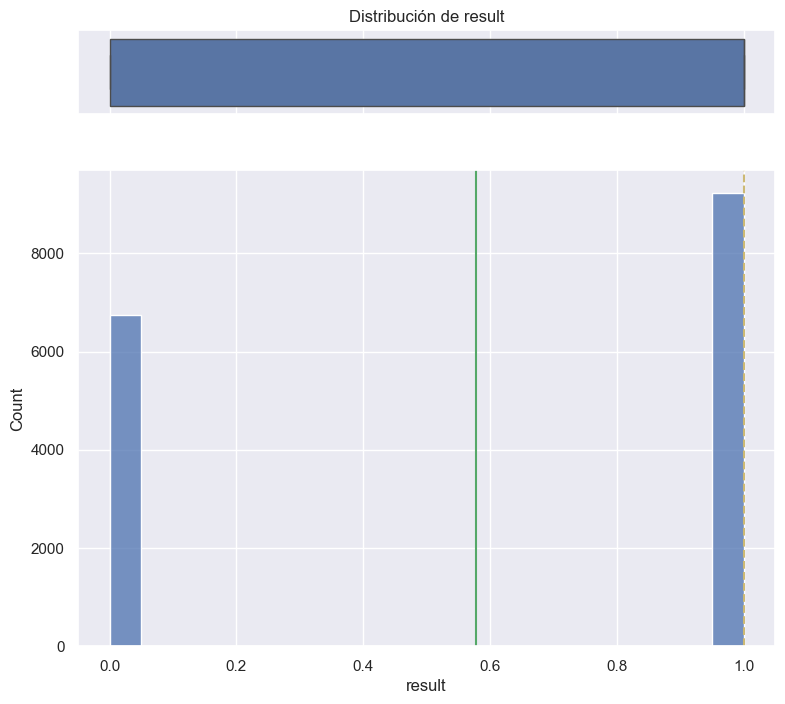

...

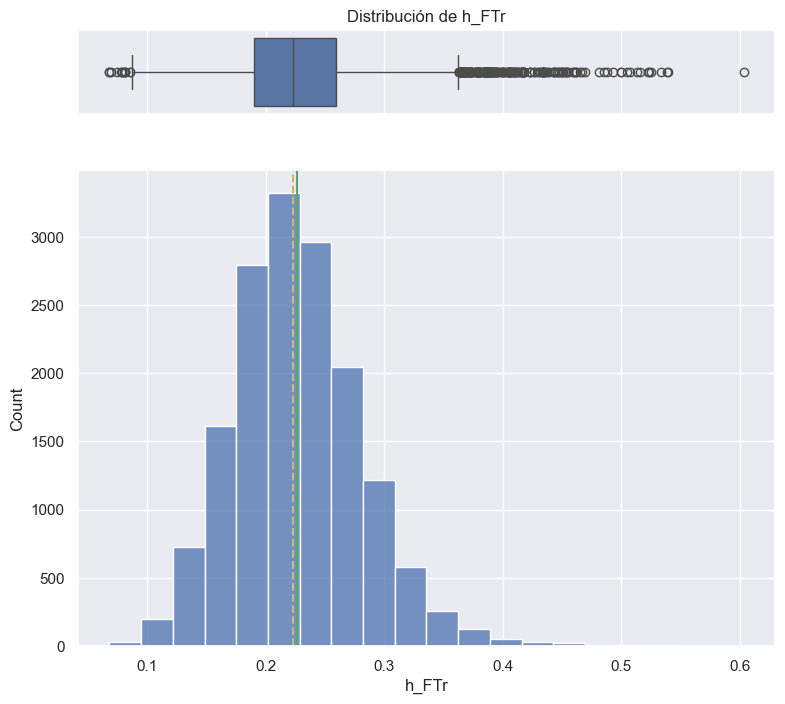

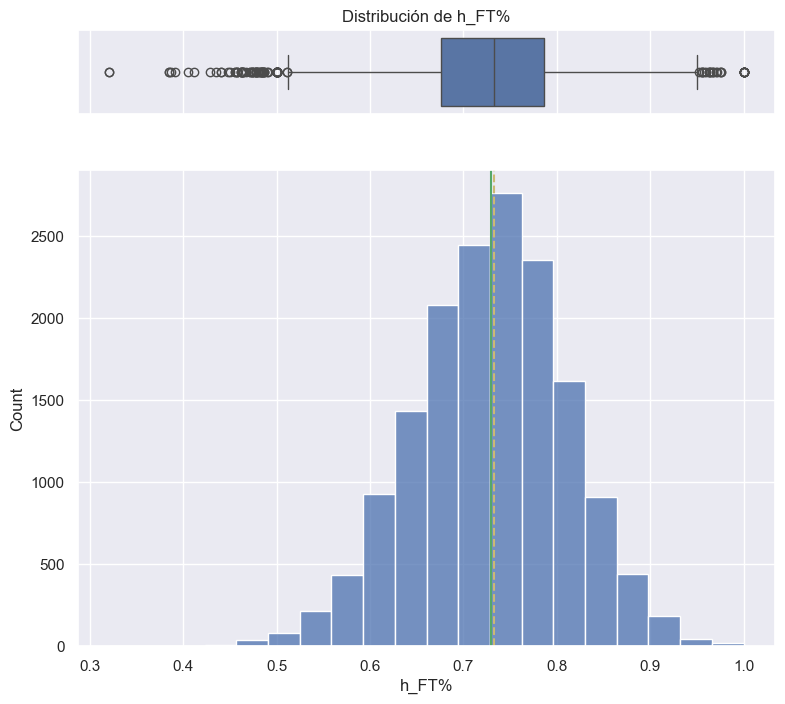

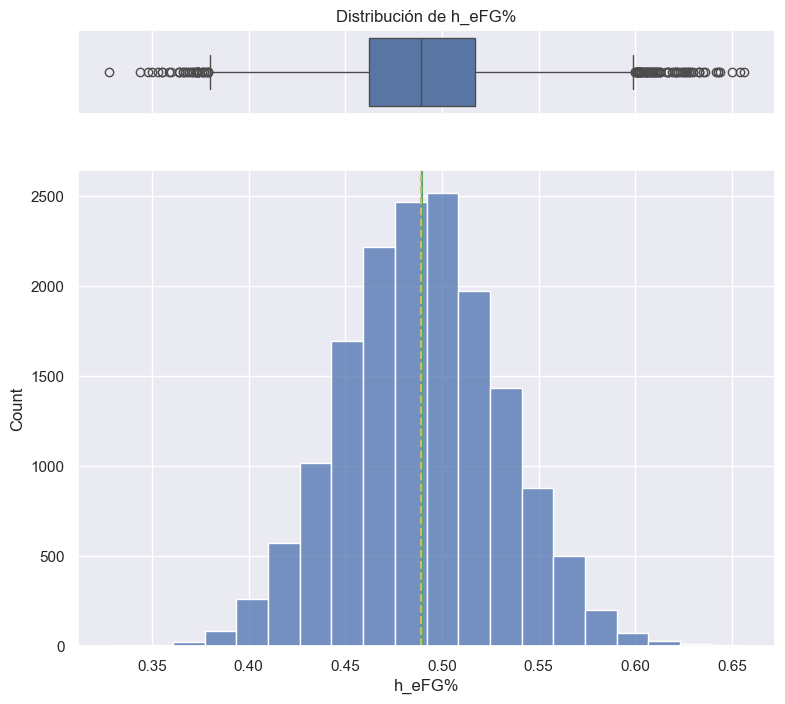

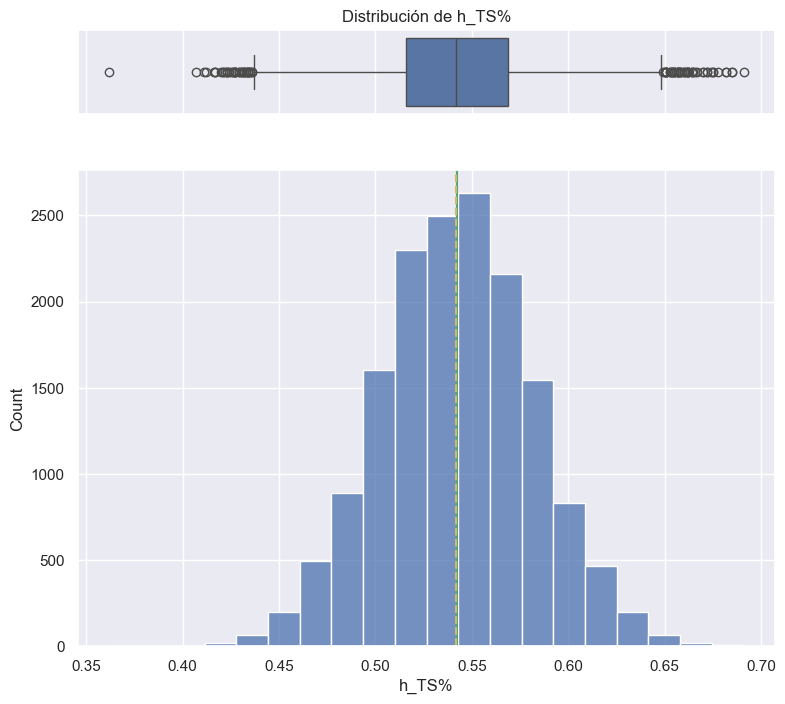

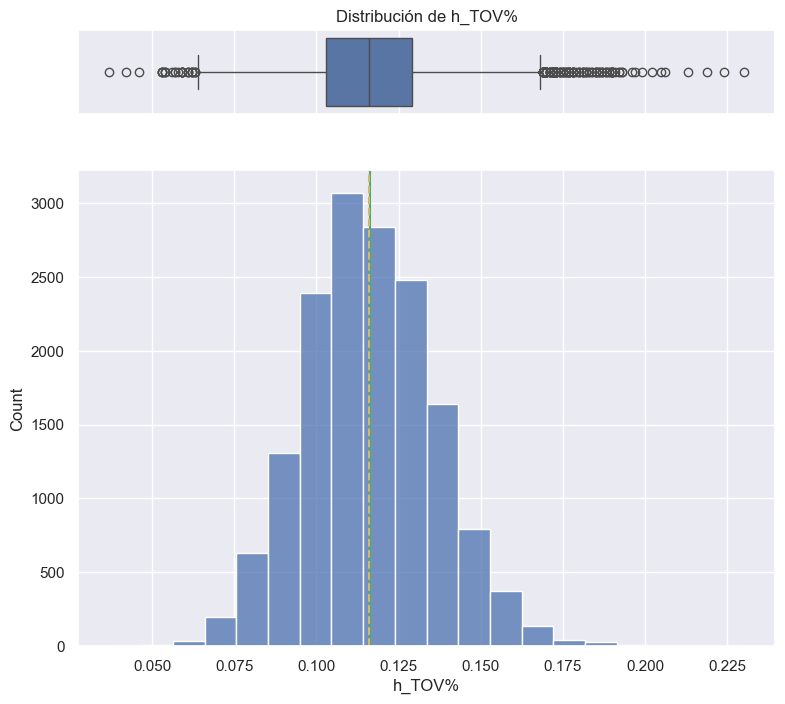

In [ ]:
for col in num_cols:
    histogram_boxplot(filtered_player_full_10[col], bins = 20, font_scale=1, title=f"Distribución de {col}")

In [25]:
varObjCont = player_full_10['result']
imput = player_full_10.drop(non_imput_columns, axis=1).copy()
varObjCont.info()

<class 'pandas.core.series.Series'>
RangeIndex: 17473 entries, 0 to 17472
Series name: result
Non-Null Count  Dtype
--------------  -----
17473 non-null  int64
dtypes: int64(1)
memory usage: 136.6 KB


In [26]:
# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x, varObjCont)), columns=['VCramer'])

# Ordenar de mayor a menor por VCramer
tablaCramer = tablaCramer.sort_values(by='VCramer', ascending=False)

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según V de Cramer
px.bar(tablaCramer, 
       x=tablaCramer.index,  # Eje X serán los nombres de las variables
       y='VCramer',          # Eje Y será el valor de V de Cramer
       title='Relaciones frente al status_group (Ordenado por VCramer)').update_yaxes(categoryorder="total ascending")

In [27]:
X_train, X_test, y_train, y_test = train_test_split(player_full_10.drop(non_imput_columns, axis=1),
                                                    player_full_10.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = player_full_10.result)

#### RandomForest

In [28]:
model_rfc = RandomForestClassifier(random_state=42,
                                   n_jobs=-1)

In [41]:
grid_param = {
#    'n_estimators': [500, 700, 1000],
#   'criterion': ['gini', 'entropy'],
#   'min_samples_leaf': [1, 2, 4],
#  'max_features': ['sqrt', 'log2'],
#   'class_weight': ['None', 'balanced', 'balanced_subsample'],
#  'max_depth': [10, 20, 30],
# 'min_samples_split': [2, 4, 6]
}

In [29]:
grid_param = {
    'n_estimators': [500],
    'criterion': ['entropy'],
    'min_samples_leaf': [4],
    'max_features': ['sqrt'],
    'class_weight': ['balanced_subsample'],
    'max_depth': [20],
    'min_samples_split': [2]
}

In [30]:
model_grid = GridSearchCV(estimator=model_rfc,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=3,
                     n_jobs=-1)

In [43]:
model_grid = model_grid.fit(X_train, y_train.values.ravel())

print(model_grid.best_score_)
print(model_grid.best_params_)
print(model_grid.cv_results_)

0.6161108485706591
{'min_samples_split': 2}
{'mean_fit_time': array([1.78426321, 1.55219014, 1.39189672]), 'std_fit_time': array([0.2321779 , 0.03149011, 0.70168495]), 'mean_score_time': array([0.23447116, 0.17380198, 0.22247322]), 'std_score_time': array([0.19207306, 0.0869263 , 0.25132577]), 'param_min_samples_split': masked_array(data=[2, 4, 6],
             mask=[False, False, False],
       fill_value=999999), 'params': [{'min_samples_split': 2}, {'min_samples_split': 4}, {'min_samples_split': 6}], 'split0_test_score': array([0.61866953, 0.61523605, 0.61909871]), 'split1_test_score': array([0.61257781, 0.61472419, 0.61000215]), 'split2_test_score': array([0.61708521, 0.61279244, 0.61386564]), 'mean_test_score': array([0.61611085, 0.6142509 , 0.61432217]), 'std_test_score': array([0.00258061, 0.00105224, 0.00372766]), 'rank_test_score': array([1, 3, 2])}


In [31]:
# Probamos el modelo con los hiperparámetros de GridSearchCV

model_rfc = RandomForestClassifier(criterion='entropy',
                                    min_samples_split=2,
                                    n_estimators=500,
                                    class_weight='balanced_subsample',
                                    max_features='sqrt',
                                    max_depth=20,
                                    min_samples_leaf=4,
                                    random_state=42,
                                    n_jobs=-1).fit(X_train, y_train)
y_pred = model_rfc.predict(X_test)


Métricas globales:
Accuracy: 0.6177
Precision (weighted): 0.61
Recall (weighted): 0.62
F1-Score (weighted): 0.61

Matriz de confusión:
[[ 667  809]
 [ 527 1492]]
Accuracy: 0.6177


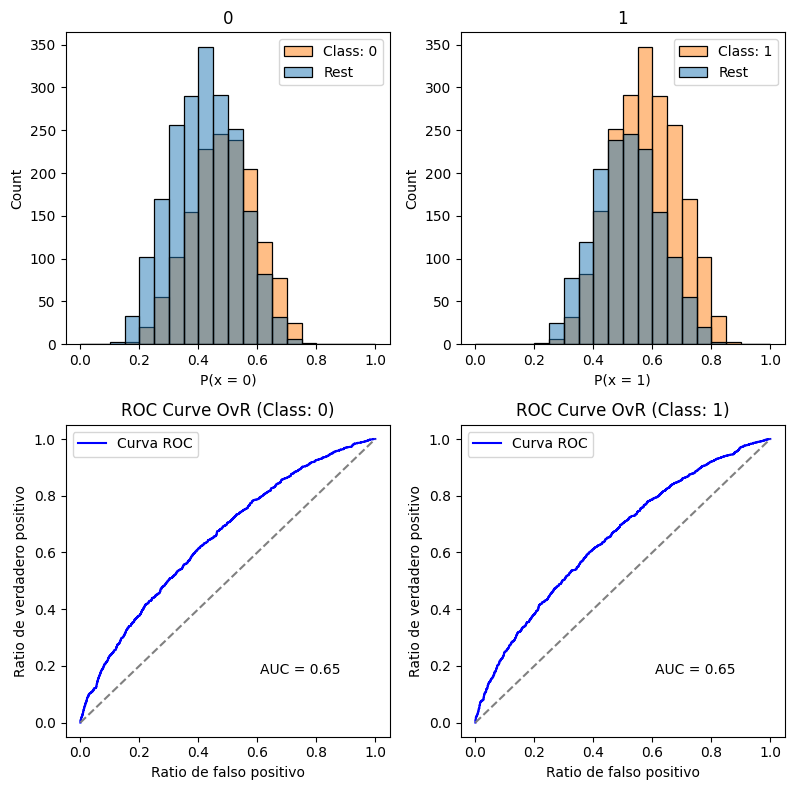

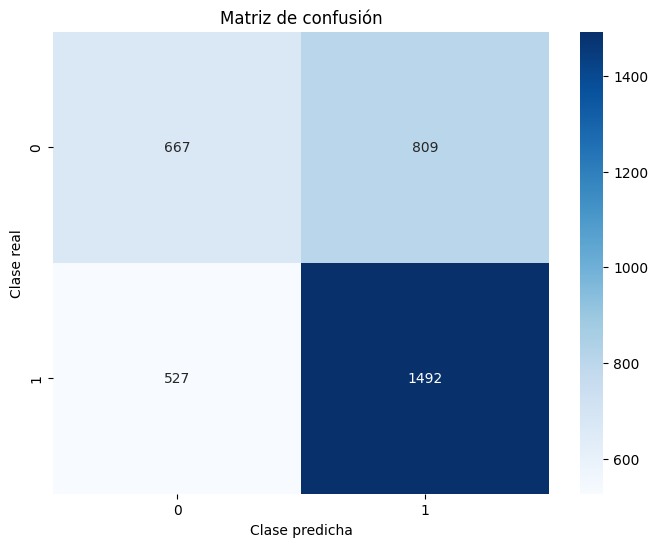

              precision    recall  f1-score   support

           0       0.56      0.45      0.50      1476
           1       0.65      0.74      0.69      2019

    accuracy                           0.62      3495
   macro avg       0.60      0.60      0.60      3495
weighted avg       0.61      0.62      0.61      3495



In [32]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_rfc.predict_proba(X_test), 
    model_multiclass=model_rfc, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="RF_10_full"
)

In [33]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.61774,0.622048,0.003912


Ranking de variables:
1. Variable h_BPM (0.038926)
2. Variable h_PIE (0.037907)
3. Variable a_BPM (0.036036)
4. Variable a_PIE (0.034237)
5. Variable a_TS% (0.026299)
6. Variable h_TS% (0.024606)
7. Variable a_eFG% (0.024460)
8. Variable a_FT% (0.024380)
9. Variable h_FT% (0.024234)
10. Variable h_eFG% (0.024200)
11. Variable a_3PAr (0.023896)
12. Variable a_3P% (0.023347)
13. Variable h_3P% (0.023145)
14. Variable h_3PAr (0.023129)
15. Variable h_FTr (0.022562)
16. Variable a_TOV% (0.022219)
17. Variable a_FTr (0.022205)
18. Variable h_FGA (0.021460)
19. Variable h_TOV% (0.020991)
20. Variable h_PTS (0.020867)
21. Variable a_PTS (0.020229)
22. Variable a_FGA (0.020106)
23. Variable a_PF (0.019236)
24. Variable h_PF (0.018907)
25. Variable a_TRB (0.018690)
26. Variable a_DRB (0.018681)
27. Variable h_TRB (0.018646)
28. Variable a_AST (0.018638)
29. Variable a_3PA (0.018615)
30. Variable h_3PA (0.018361)
31. Variable h_AST (0.018235)
32. Variable h_DRB (0.017795)
33. Variable h_FG (0.01

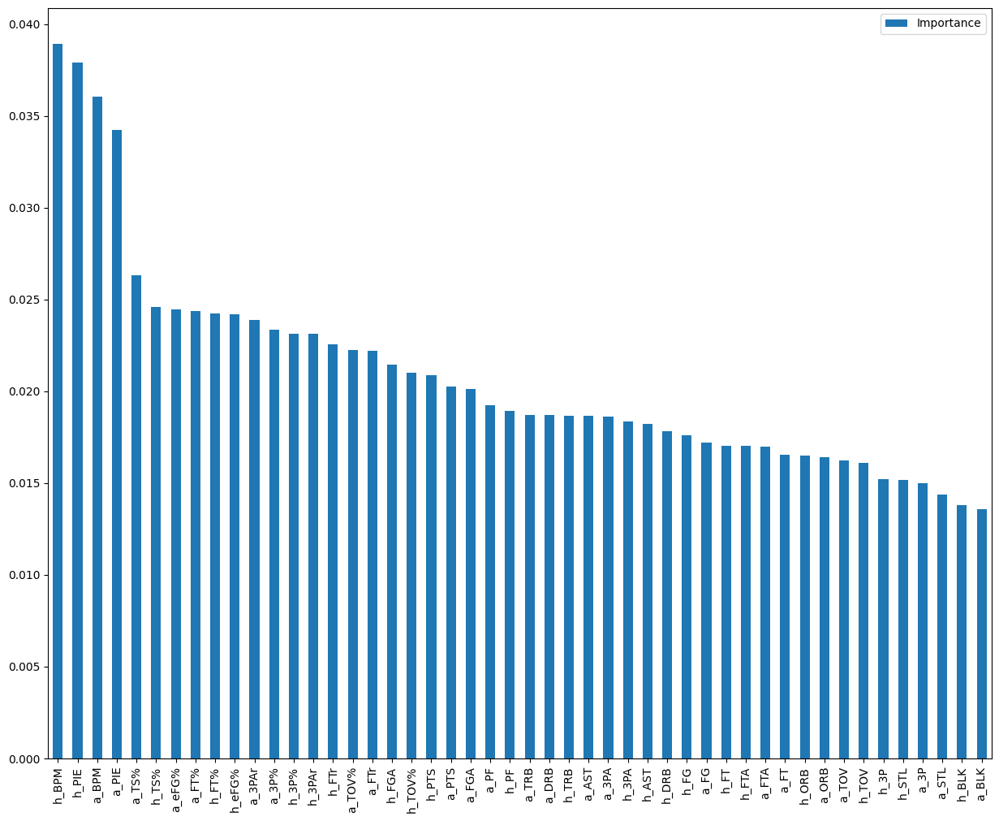

In [34]:
importancias_modelo(model_rfc, X_train)

Ahora, vamos a ver si podemos mejorar el rendimiento de nuestro modelo buscando aquellas variables con valores más allá de los rangos IQR

In [35]:
for col in imput.select_dtypes(include=['float64']).columns:
    iqr_df = valores_fuera_rango(imput[col], col, iqr_df)

In [36]:
iqr_df.sort_values(by='Porcentaje fuera de rango', ascending=False)

,Variable,Valores fuera de rango,Porcentaje fuera de rango
1,a_FGA,501,2.867281
0,a_FG,440,2.518171
25,h_FGA,420,2.403709
39,h_BPM,414,2.369370
15,a_BPM,381,2.180507
14,a_PTS,379,2.169061
38,h_PTS,374,2.140445
9,a_AST,315,1.802781
17,a_3P%,298,1.705488
24,h_FG,298,1.705488


In [85]:
variables_outliers = iqr_df[iqr_df['Porcentaje fuera de rango'] > 2]['Variable'].values

In [86]:
variables_outliers

array(['a_FG', 'a_FGA', 'a_PTS', 'a_BPM', 'h_FGA', 'h_PTS', 'h_BPM'],
      dtype=object)

In [57]:
filtered_player_full_10_PIE_BPM = remove_outliers_iqr(player_full_10, ['a_PIE', 'h_PIE', 'a_BPM', 'h_BPM'])

Processing column: a_PIE
Lower bound: 30.925000000000008, Upper bound: 70.725
Number of records after filtering a_PIE: 17216
Processing column: h_PIE
Lower bound: 31.05, Upper bound: 70.64999999999999
Number of records after filtering h_PIE: 16959
Processing column: a_BPM
Lower bound: -76.97499999999998, Upper bound: 33.22499999999999
Number of records after filtering a_BPM: 16585
Processing column: h_BPM
Lower bound: -78.20000000000002, Upper bound: 33.80000000000001
Number of records after filtering h_BPM: 16194


In [38]:
varObjCont = filtered_player_full_10_PIE_BPM['result']
imput = filtered_player_full_10_PIE_BPM.drop(non_imput_columns, axis=1).copy()

In [39]:
# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x, varObjCont)), columns=['VCramer'])

# Ordenar de mayor a menor por VCramer
tablaCramer = tablaCramer.sort_values(by='VCramer', ascending=False)

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según V de Cramer
px.bar(tablaCramer, 
       x=tablaCramer.index,  # Eje X serán los nombres de las variables
       y='VCramer',          # Eje Y será el valor de V de Cramer
       title='Relaciones frente al status_group (Ordenado por VCramer)').update_yaxes(categoryorder="total ascending")

In [40]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PIE_BPM.result)

In [41]:
model_rfc = RandomForestClassifier(random_state=42,
                                   n_jobs=-1)

In [42]:
grid_param = {
    'n_estimators': [500],
    'criterion': ['entropy'],
    'min_samples_leaf': [4],
    'max_features': ['sqrt'],
    'class_weight': ['balanced_subsample'],
    'max_depth': [20],
    'min_samples_split': [2]
}

In [96]:
model_grid = model_grid.fit(X_train, y_train.values.ravel())

print(model_grid.best_score_)
print(model_grid.best_params_)
print(model_grid.cv_results_)

0.6223951998702667
{'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'mean_fit_time': array([3.83764291]), 'std_fit_time': array([0.10073567]), 'mean_score_time': array([0.16066114]), 'std_score_time': array([0.03193624]), 'param_class_weight': masked_array(data=['balanced_subsample'],
             mask=[False],
       fill_value='?',
            dtype=object), 'param_criterion': masked_array(data=['entropy'],
             mask=[False],
       fill_value='?',
            dtype=object), 'param_max_depth': masked_array(data=[20],
             mask=[False],
       fill_value=999999), 'param_max_features': masked_array(data=['sqrt'],
             mask=[False],
       fill_value='?',
            dtype=object), 'param_min_samples_leaf': masked_array(data=[4],
             mask=[False],
       fill_value=999999), 'param_min_samples_split': masked_array(data=[2],
         

In [43]:
# Probamos el modelo con los hiperparámetros de GridSearchCV

model_rfc = RandomForestClassifier(criterion='entropy',
                                    min_samples_split=2,
                                    n_estimators=500,
                                    class_weight='balanced_subsample',
                                    max_features='sqrt',
                                    max_depth=20,
                                    min_samples_leaf=4,
                                    random_state=42,
                                    n_jobs=-1).fit(X_train, y_train)
y_pred = model_rfc.predict(X_test)


Métricas globales:
Accuracy: 0.6209
Precision (weighted): 0.61
Recall (weighted): 0.62
F1-Score (weighted): 0.61

Matriz de confusión:
[[ 608  759]
 [ 469 1403]]
Accuracy: 0.6209


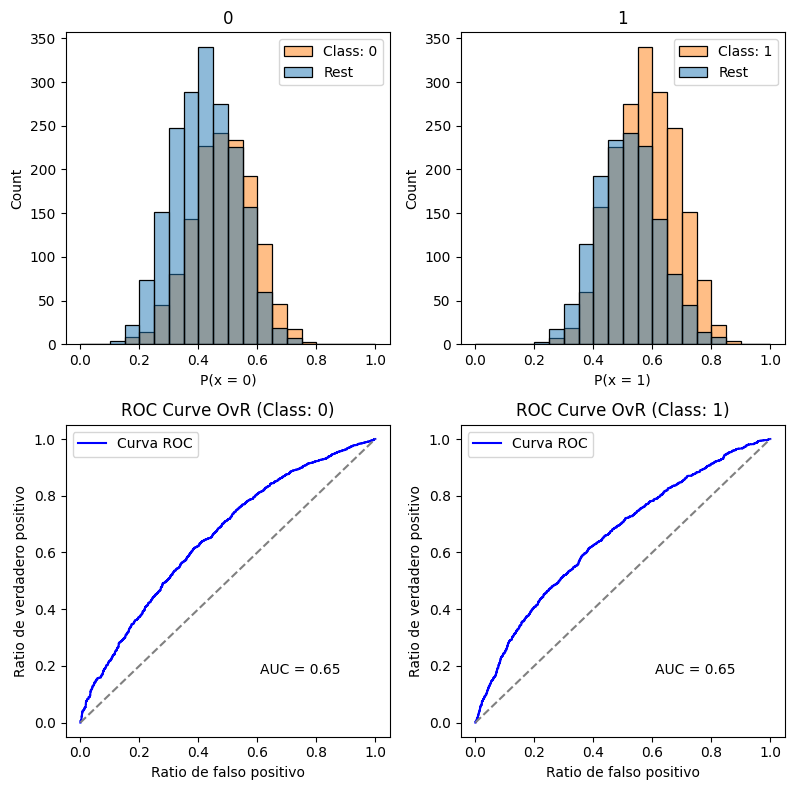

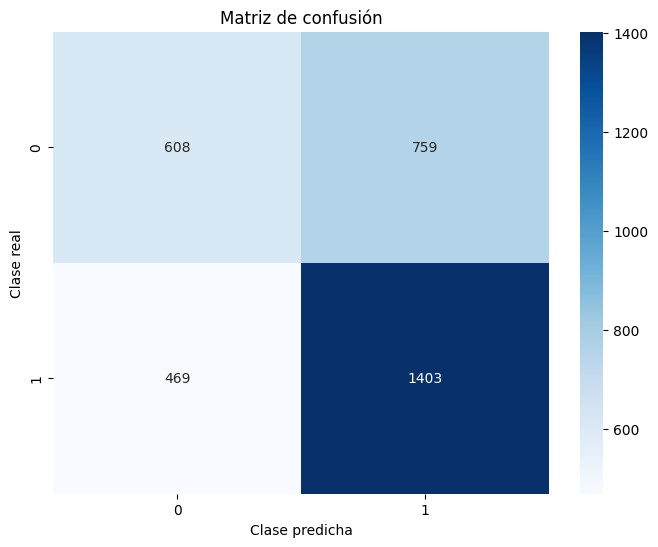

              precision    recall  f1-score   support

           0       0.56      0.44      0.50      1367
           1       0.65      0.75      0.70      1872

    accuracy                           0.62      3239
   macro avg       0.61      0.60      0.60      3239
weighted avg       0.61      0.62      0.61      3239



In [44]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_rfc.predict_proba(X_test), 
    model_multiclass=model_rfc, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="RF_10_filtered_PIE_BPM"
)

Ranking de variables:
1. Variable h_BPM (0.040250)
2. Variable h_PIE (0.037310)
3. Variable a_BPM (0.035215)
4. Variable a_PIE (0.032124)
5. Variable h_eFG% (0.025870)
6. Variable a_TS% (0.025647)
7. Variable h_TS% (0.025050)
8. Variable a_eFG% (0.025023)
9. Variable a_3P% (0.024231)
10. Variable h_3PAr (0.024166)
11. Variable a_FT% (0.024019)
12. Variable a_3PAr (0.023783)
13. Variable h_FT% (0.023782)
14. Variable h_3P% (0.023411)
15. Variable h_FTr (0.022735)
16. Variable a_FTr (0.022185)
17. Variable a_TOV% (0.021783)
18. Variable h_TOV% (0.020973)
19. Variable h_FGA (0.020665)
20. Variable a_FGA (0.020485)
21. Variable h_PTS (0.020389)
22. Variable a_PTS (0.019946)
23. Variable h_3PA (0.018973)
24. Variable a_PF (0.018960)
25. Variable a_3PA (0.018909)
26. Variable a_DRB (0.018541)
27. Variable h_PF (0.018532)
28. Variable a_TRB (0.018491)
29. Variable h_TRB (0.018376)
30. Variable a_AST (0.018044)
31. Variable h_AST (0.018024)
32. Variable h_DRB (0.017917)
33. Variable h_FG (0.01

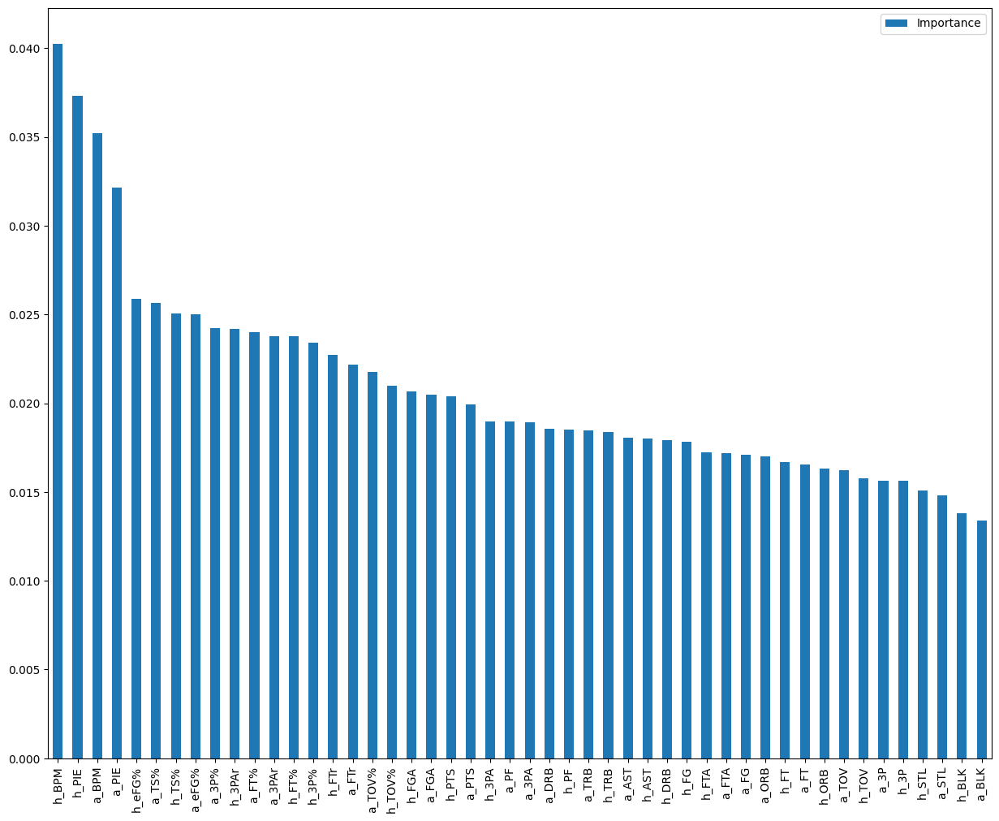

In [45]:
importancias_modelo(model_rfc, X_train)

In [46]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556


In [58]:
filtered_player_full_10_PTS_PIE_BPM = remove_outliers_iqr(player_full_10, ['a_PTS', 'h_PTS', 'a_BPM', 'h_BPM', 'a_PIE', 'h_PIE'])

Processing column: a_PTS
Lower bound: 70.5, Upper bound: 142.5
Number of records after filtering a_PTS: 17094
Processing column: h_PTS
Lower bound: 69.75, Upper bound: 143.75
Number of records after filtering h_PTS: 16749
Processing column: a_BPM
Lower bound: -77.325, Upper bound: 33.275000000000006
Number of records after filtering a_BPM: 16377
Processing column: h_BPM
Lower bound: -78.77499999999999, Upper bound: 33.824999999999996
Number of records after filtering h_BPM: 15982
Processing column: a_PIE
Lower bound: 31.649999999999995, Upper bound: 70.05
Number of records after filtering a_PIE: 15838
Processing column: h_PIE
Lower bound: 31.700000000000006, Upper bound: 69.99999999999999
Number of records after filtering h_PIE: 15689


In [48]:
varObjCont = filtered_player_full_10_PTS_PIE_BPM['result']
imput = filtered_player_full_10_PTS_PIE_BPM.drop(non_imput_columns, axis=1).copy()

In [49]:
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x, varObjCont)), columns=['VCramer'])    
tablaCramer = tablaCramer.sort_values(by='VCramer', ascending=False)
px.bar(tablaCramer,
         x=tablaCramer.index,
         y='VCramer',
         title='Relaciones frente al status_group (Ordenado por VCramer)').update_yaxes(categoryorder="total ascending")

In [50]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PTS_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PTS_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PTS_PIE_BPM.result)

In [51]:
model_rfc = RandomForestClassifier(random_state=42,
                                      n_jobs=-1)

In [52]:
grid_param = {
    'n_estimators': [500],
    'criterion': ['entropy'],
    'min_samples_leaf': [4],
    'max_features': ['sqrt'],
    'class_weight': ['balanced_subsample'],
    'max_depth': [20],
    'min_samples_split': [2]
}

In [53]:
# Probamos el modelo con los hiperparámetros de GridSearchCV

model_rfc = RandomForestClassifier(criterion='entropy',
                                    min_samples_split=2,
                                    n_estimators=500,
                                    class_weight='balanced_subsample',
                                    max_features='sqrt',
                                    max_depth=20,
                                    min_samples_leaf=4,
                                    random_state=42,
                                    n_jobs=-1).fit(X_train, y_train)
y_pred = model_rfc.predict(X_test)


Métricas globales:
Accuracy: 0.6122
Precision (weighted): 0.60
Recall (weighted): 0.61
F1-Score (weighted): 0.60

Matriz de confusión:
[[ 572  753]
 [ 464 1349]]
Accuracy: 0.6122


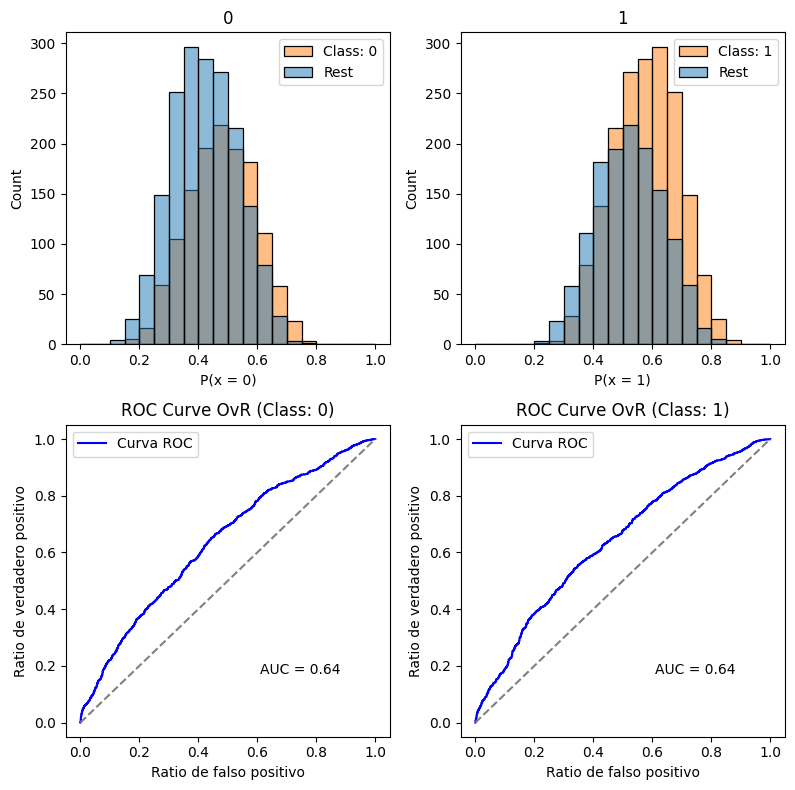

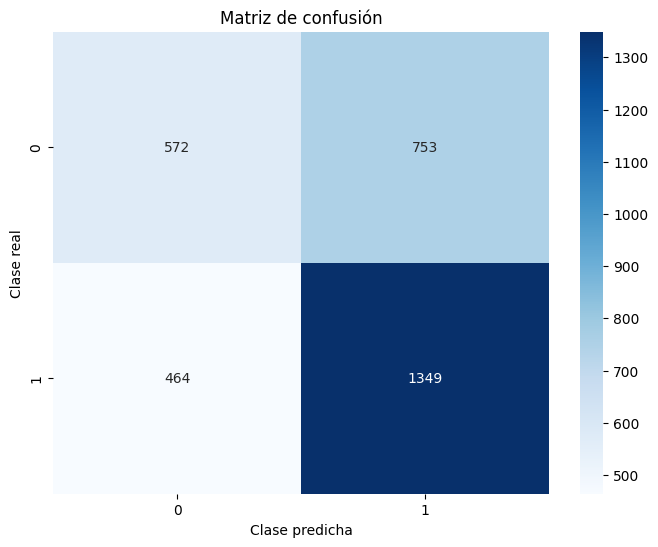

              precision    recall  f1-score   support

           0       0.55      0.43      0.48      1325
           1       0.64      0.74      0.69      1813

    accuracy                           0.61      3138
   macro avg       0.60      0.59      0.59      3138
weighted avg       0.60      0.61      0.60      3138



In [54]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_rfc.predict_proba(X_test), 
    model_multiclass=model_rfc, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="RF_10_filtered_PTS_BPM_PIE"
)

Ranking de variables:
1. Variable h_BPM (0.039865)
2. Variable h_PIE (0.038860)
3. Variable a_BPM (0.035940)
4. Variable a_PIE (0.034065)
5. Variable h_eFG% (0.025667)
6. Variable a_eFG% (0.025163)
7. Variable h_TS% (0.025046)
8. Variable a_TS% (0.024829)
9. Variable a_3PAr (0.024136)
10. Variable a_FT% (0.024041)
11. Variable a_3P% (0.023920)
12. Variable h_FT% (0.023842)
13. Variable h_3PAr (0.023120)
14. Variable h_3P% (0.023045)
15. Variable h_FTr (0.022603)
16. Variable a_FTr (0.021997)
17. Variable h_TOV% (0.021161)
18. Variable h_FGA (0.021061)
19. Variable a_TOV% (0.020918)
20. Variable h_PTS (0.020639)
21. Variable a_FGA (0.020303)
22. Variable a_PTS (0.020298)
23. Variable a_AST (0.019214)
24. Variable a_3PA (0.019074)
25. Variable h_3PA (0.018507)
26. Variable h_PF (0.018477)
27. Variable h_AST (0.018282)
28. Variable a_DRB (0.018238)
29. Variable h_TRB (0.018121)
30. Variable a_PF (0.018023)
31. Variable a_TRB (0.017926)
32. Variable h_DRB (0.017838)
33. Variable h_FG (0.01

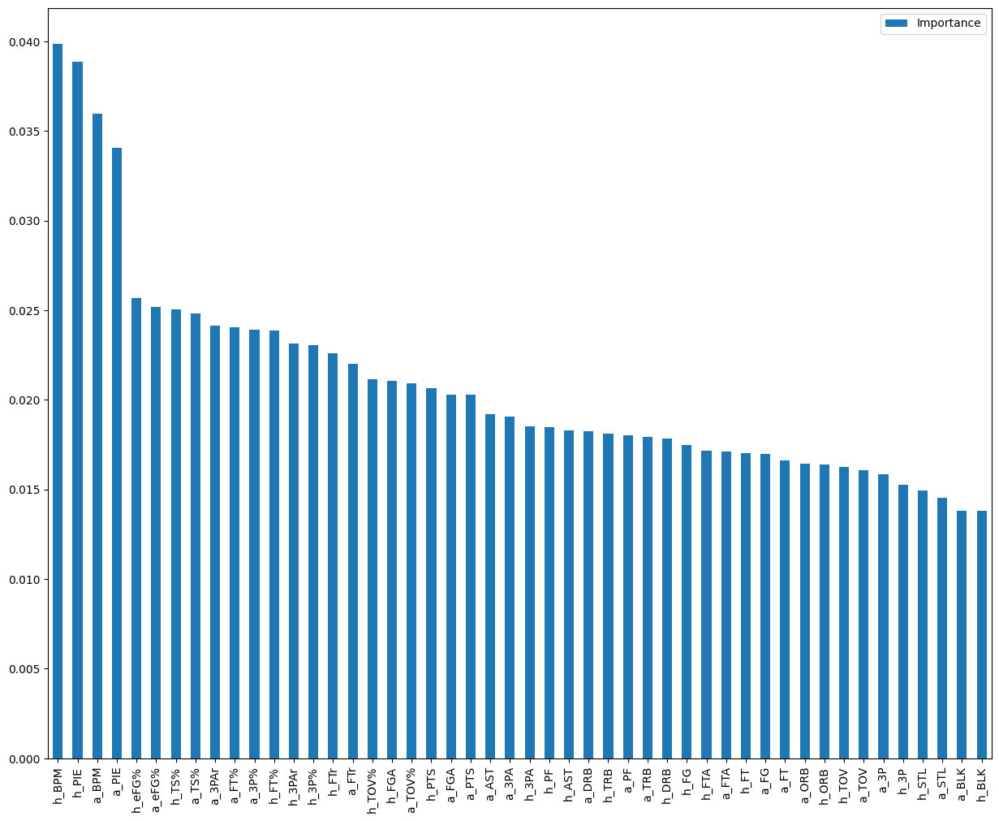

In [55]:
importancias_modelo(model_rfc, X_train)

In [56]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214


#### LogisticRegression

In [59]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PTS_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PTS_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PTS_PIE_BPM.result)

In [60]:
model_log = LogisticRegression(random_state=42,
                                   n_jobs=-1)

In [61]:
grid_param = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 1000, 2500, 5000]
}

In [64]:
model_grid = GridSearchCV(estimator=model_log,
                     param_grid=grid_param,
                     scoring='accuracy',
                     cv=3,
                     n_jobs=-3)

In [65]:
model_grid = model_grid.fit(X_train, y_train.values.ravel())

print(model_grid.best_score_)
print(model_grid.best_params_)
print(model_grid.cv_results_)

0.6244131417843964
{'C': 1000, 'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
{'mean_fit_time': array([7.68717130e-03, 5.50738970e-03, 2.67016013e-01, 6.52162234e-03,
       2.75612752e-01, 3.17595800e-01, 2.83391794e-01, 2.71743218e-01,
       6.28289620e-01, 8.33266735e-01, 6.78491592e-03, 5.96714020e-03,
       5.42068481e-03, 5.92279434e-03, 5.09691238e-03, 5.21763166e-03,
       4.93923823e-03, 2.14347680e-01, 6.52766228e-03, 2.38083363e-01,
       2.62968699e-01, 8.10386260e-01, 2.39238501e-01, 5.96008380e-01,
       1.01056997e+00, 6.19848569e-03, 6.58257802e-03, 6.43642743e-03,
       5.05590439e-03, 4.92819150e-03, 5.59242566e-03, 5.74358304e-03,
       2.04649846e-01, 5.87097804e-03, 2.27715254e-01, 2.68316905e-01,
       8.25453361e-01, 2.64346759e-01, 5.89618444e-01, 1.04438090e+00,
       6.32246335e-03, 5.81558545e-03, 5.25148710e-03, 4.08109029e-03,
       4.58041827e-03, 4.09897168e-03, 5.44007619e-03, 2.02309926e-01,
       4.75955009e-03, 2.27340380e-01, 2.4

In [66]:
# Probamos el modelo con los hiperparámetros de GridSearchCV

model_log = LogisticRegression(C=1000,
                               max_iter=100,
                               penalty='l2',
                               solver='newton-cg',
                               random_state=42,
                               n_jobs=-1).fit(X_train, y_train)
y_pred = model_log.predict(X_test)


Métricas globales:
Accuracy: 0.6170
Precision (weighted): 0.61
Recall (weighted): 0.62
F1-Score (weighted): 0.60

Matriz de confusión:
[[ 513  812]
 [ 390 1423]]
Accuracy: 0.6170


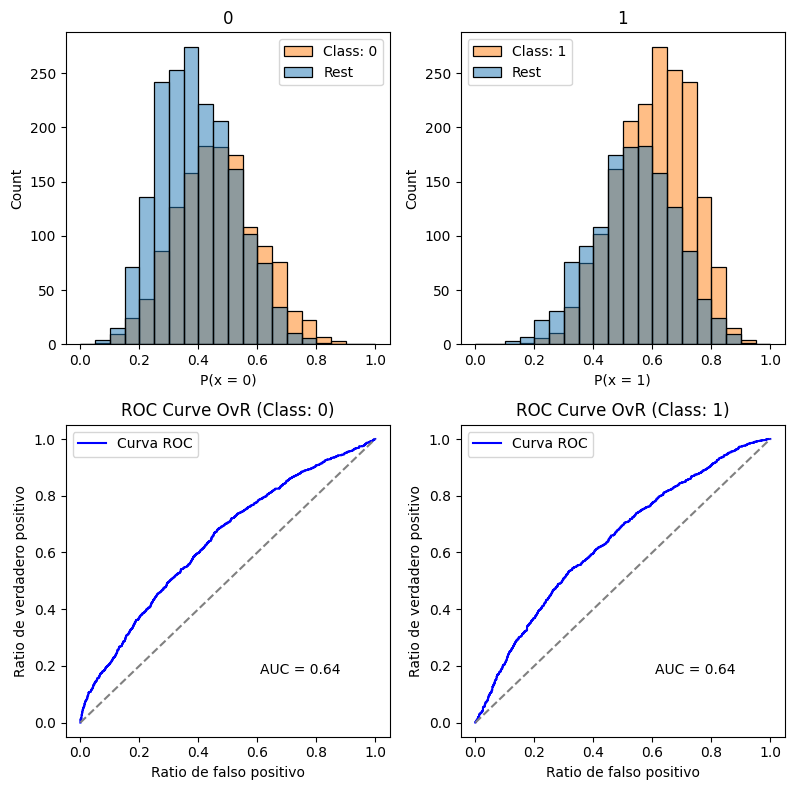

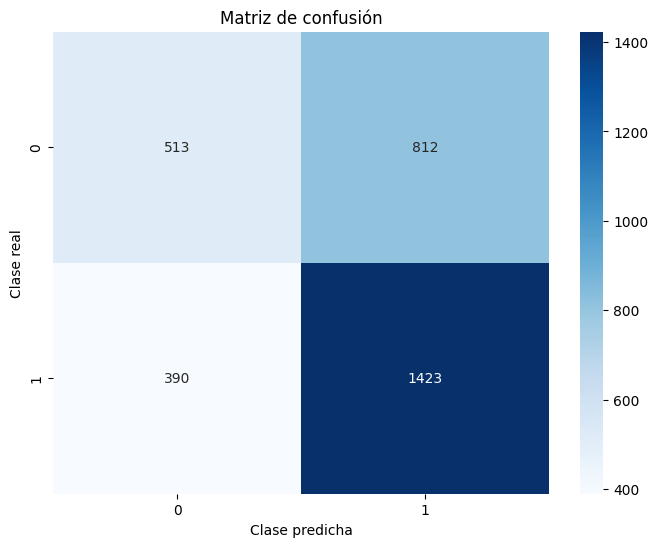

              precision    recall  f1-score   support

           0       0.57      0.39      0.46      1325
           1       0.64      0.78      0.70      1813

    accuracy                           0.62      3138
   macro avg       0.60      0.59      0.58      3138
weighted avg       0.61      0.62      0.60      3138



In [67]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_log.predict_proba(X_test), 
    model_multiclass=model_log, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="Log_10_full"
)

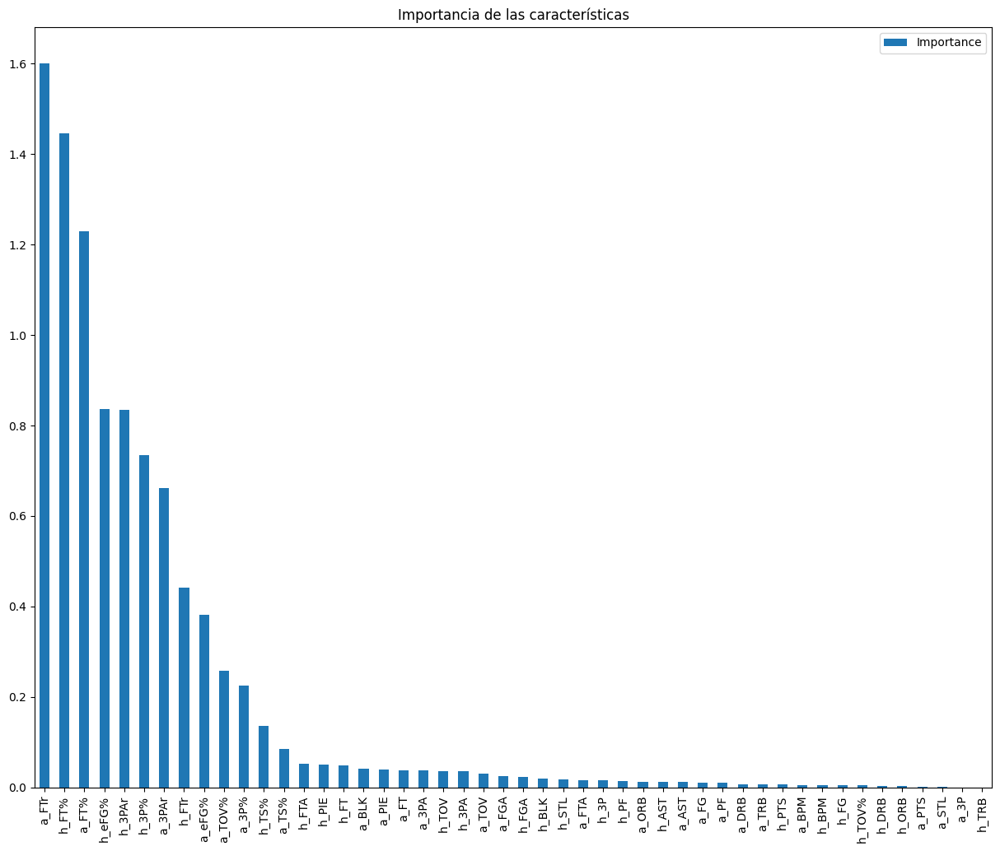

Ranking de variables:
1. Variable a_FTr (1.6006859586001234)
2. Variable h_FT% (1.4458152468346352)
3. Variable a_FT% (1.2289914502788728)
4. Variable h_eFG% (0.8362128218889291)
5. Variable h_3PAr (0.8344057527794831)
6. Variable h_3P% (0.734696273471981)
7. Variable a_3PAr (0.6618496861408579)
8. Variable h_FTr (0.440874400203351)
9. Variable a_eFG% (0.3816718349721766)
10. Variable a_TOV% (0.25854280830678356)
11. Variable a_3P% (0.22530794562987078)
12. Variable h_TS% (0.13557547124906044)
13. Variable a_TS% (0.08525452741205518)
14. Variable h_FTA (0.052345614998293696)
15. Variable h_PIE (0.04989401948135607)
16. Variable h_FT (0.049015344473556106)
17. Variable a_BLK (0.041959569548153344)
18. Variable a_PIE (0.04049410258455006)
19. Variable a_FT (0.03753689153947623)
20. Variable a_3PA (0.03735157731274269)
21. Variable h_TOV (0.03672248414277028)
22. Variable h_3PA (0.03541467431382491)
23. Variable a_TOV (0.03120015548184048)
24. Variable a_FGA (0.024576280326526846)
25. Var

In [70]:
importancias_modelo(model_log, X_train)

In [71]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098


In [72]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PIE_BPM.result)

In [73]:
model_log = LogisticRegression(C=1000,
                                 max_iter=100,
                                 penalty='l2',
                                 solver='newton-cg',
                                 random_state=42,
                                 n_jobs=-1).fit(X_train, y_train)

y_pred = model_log.predict(X_test)


Métricas globales:
Accuracy: 0.6141
Precision (weighted): 0.60
Recall (weighted): 0.61
F1-Score (weighted): 0.60

Matriz de confusión:
[[ 521  846]
 [ 404 1468]]
Accuracy: 0.6141


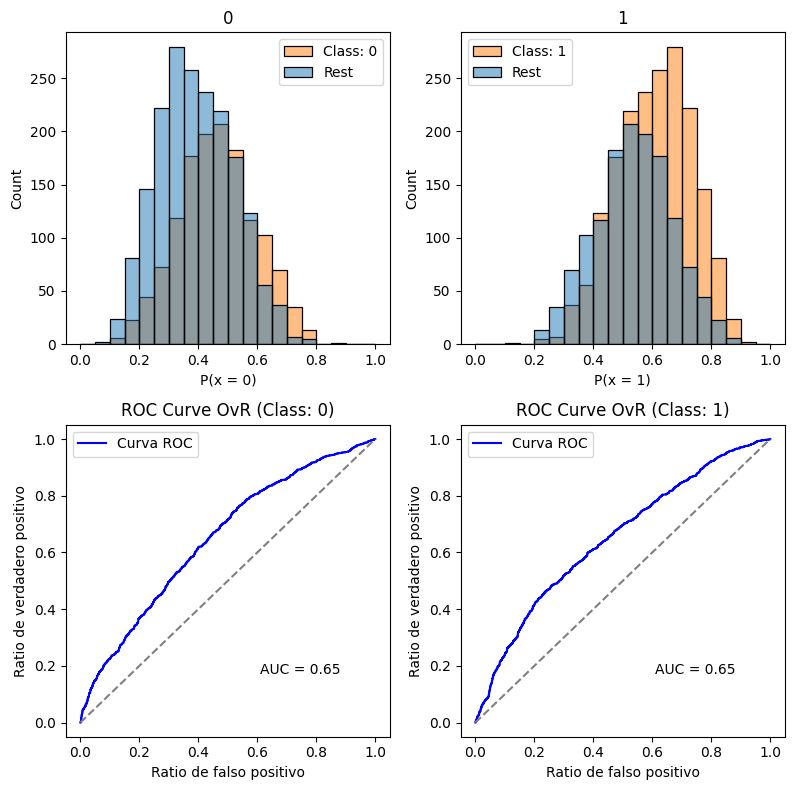

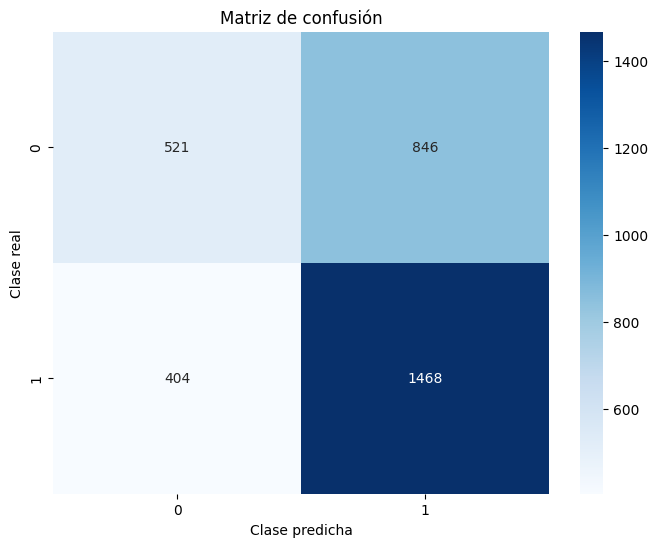

              precision    recall  f1-score   support

           0       0.56      0.38      0.45      1367
           1       0.63      0.78      0.70      1872

    accuracy                           0.61      3239
   macro avg       0.60      0.58      0.58      3239
weighted avg       0.60      0.61      0.60      3239



In [74]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_log.predict_proba(X_test), 
    model_multiclass=model_log, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="Log_10_filtered_PIE_BPM"
)

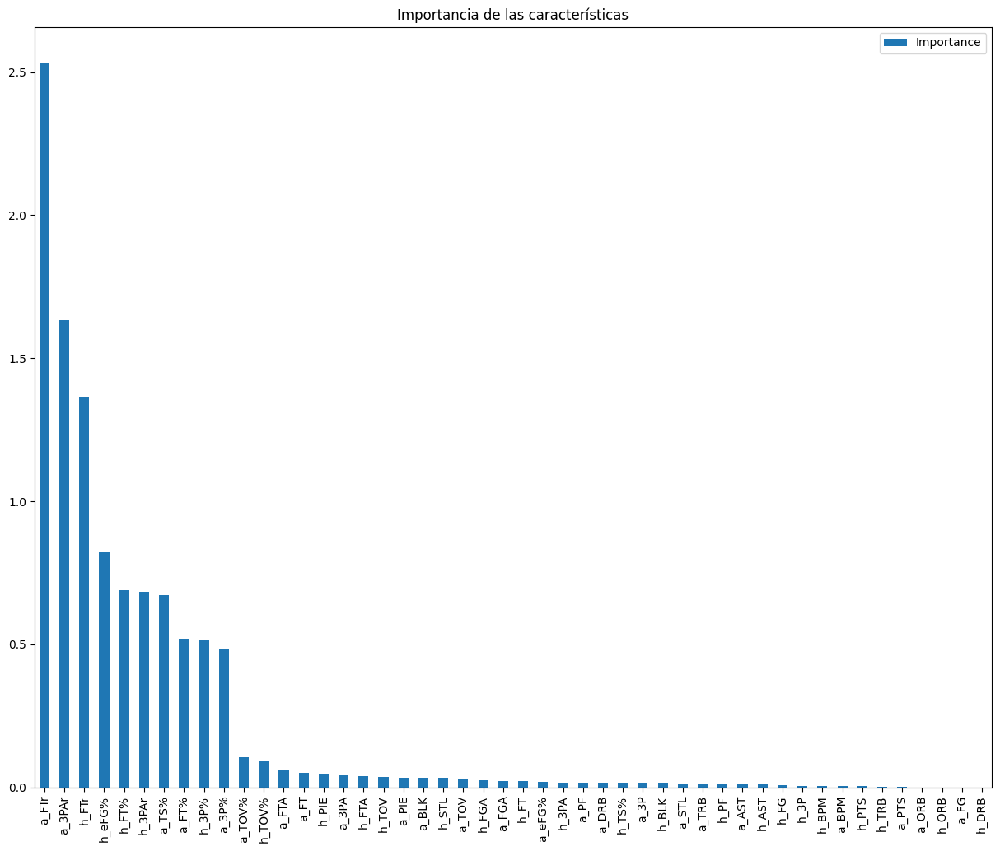

Ranking de variables:
1. Variable a_FTr (2.531150600070396)
2. Variable a_3PAr (1.6316979173783843)
3. Variable h_FTr (1.3652217642798574)
4. Variable h_eFG% (0.8208992933887762)
5. Variable h_FT% (0.688438921361653)
6. Variable h_3PAr (0.6852078337796985)
7. Variable a_TS% (0.6729388234641722)
8. Variable a_FT% (0.5161868551843134)
9. Variable h_3P% (0.5130957921533754)
10. Variable a_3P% (0.4832689547153391)
11. Variable a_TOV% (0.10608379971816366)
12. Variable h_TOV% (0.0901547501941809)
13. Variable a_FTA (0.05892277831553165)
14. Variable a_FT (0.05019192541817601)
15. Variable h_PIE (0.04411616765878448)
16. Variable a_3PA (0.04172352354234829)
17. Variable h_FTA (0.040405764220052265)
18. Variable h_TOV (0.03586174221110654)
19. Variable a_PIE (0.034567656171145364)
20. Variable a_BLK (0.033334458982636345)
21. Variable h_STL (0.03305225453380727)
22. Variable a_TOV (0.03198179582998825)
23. Variable h_FGA (0.024534906310864555)
24. Variable a_FGA (0.02164491886896222)
25. Vari

In [75]:
importancias_modelo(model_log, X_train)

In [76]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704


In [77]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PTS_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PTS_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PTS_PIE_BPM.result)

model_log = LogisticRegression(C=1000,
                                    max_iter=100,
                                    penalty='l2',
                                    solver='newton-cg',
                                    random_state=42,
                                    n_jobs=-1).fit(X_train, y_train)

y_pred = model_log.predict(X_test)


Métricas globales:
Accuracy: 0.6170
Precision (weighted): 0.61
Recall (weighted): 0.62
F1-Score (weighted): 0.60

Matriz de confusión:
[[ 513  812]
 [ 390 1423]]
Accuracy: 0.6170


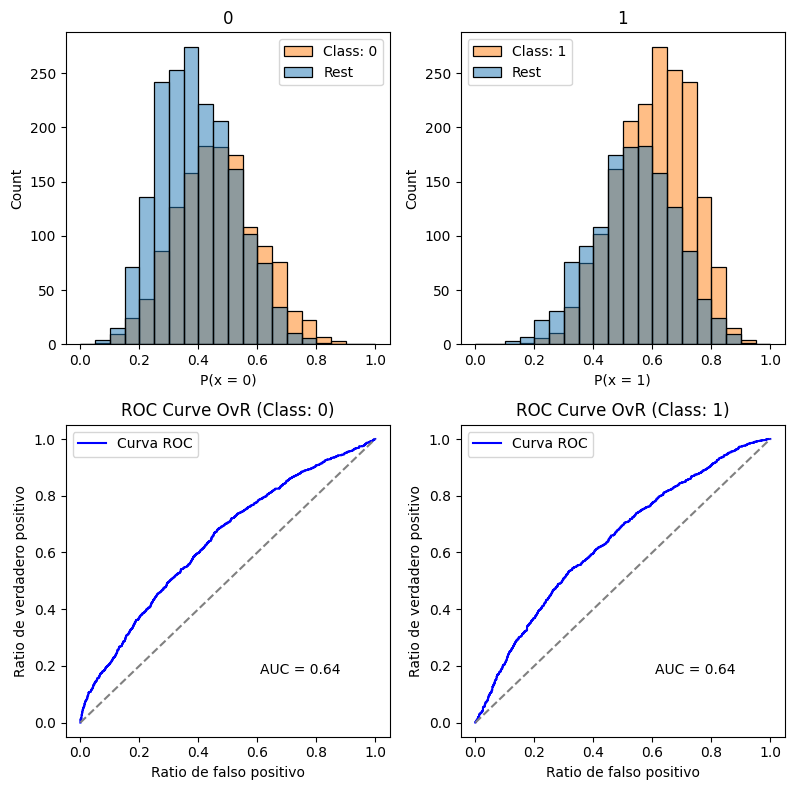

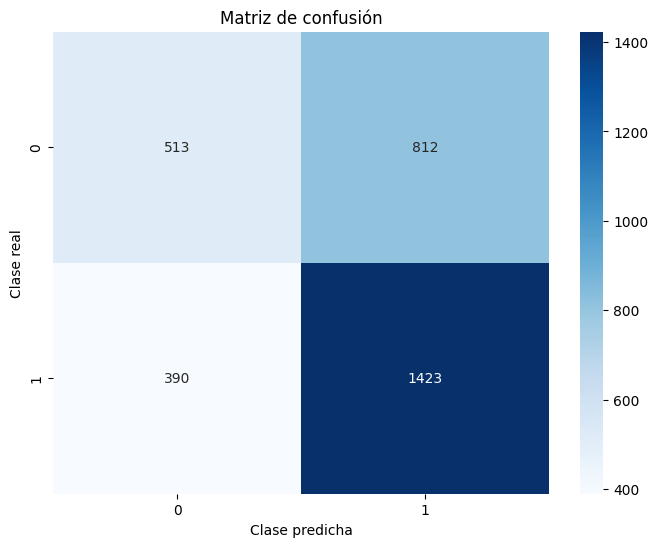

              precision    recall  f1-score   support

           0       0.57      0.39      0.46      1325
           1       0.64      0.78      0.70      1813

    accuracy                           0.62      3138
   macro avg       0.60      0.59      0.58      3138
weighted avg       0.61      0.62      0.60      3138



In [78]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_log.predict_proba(X_test), 
    model_multiclass=model_log, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="Log_10_filtered_PTS_PIE_BPM"
)

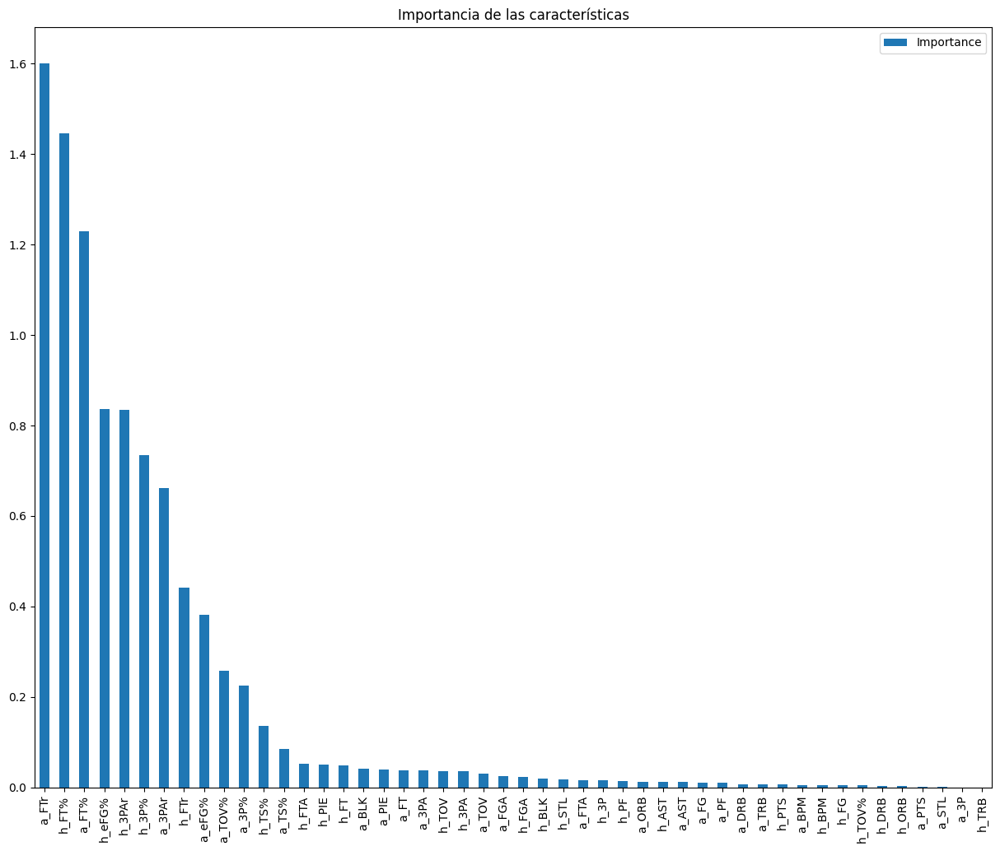

Ranking de variables:
1. Variable a_FTr (1.6006859586001234)
2. Variable h_FT% (1.4458152468346352)
3. Variable a_FT% (1.2289914502788728)
4. Variable h_eFG% (0.8362128218889291)
5. Variable h_3PAr (0.8344057527794831)
6. Variable h_3P% (0.734696273471981)
7. Variable a_3PAr (0.6618496861408579)
8. Variable h_FTr (0.440874400203351)
9. Variable a_eFG% (0.3816718349721766)
10. Variable a_TOV% (0.25854280830678356)
11. Variable a_3P% (0.22530794562987078)
12. Variable h_TS% (0.13557547124906044)
13. Variable a_TS% (0.08525452741205518)
14. Variable h_FTA (0.052345614998293696)
15. Variable h_PIE (0.04989401948135607)
16. Variable h_FT (0.049015344473556106)
17. Variable a_BLK (0.041959569548153344)
18. Variable a_PIE (0.04049410258455006)
19. Variable a_FT (0.03753689153947623)
20. Variable a_3PA (0.03735157731274269)
21. Variable h_TOV (0.03672248414277028)
22. Variable h_3PA (0.03541467431382491)
23. Variable a_TOV (0.03120015548184048)
24. Variable a_FGA (0.024576280326526846)
25. Var

In [79]:
importancias_modelo(model_log, X_train)

In [80]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098


In [81]:
filtered_player_full_10_FTr = remove_outliers_iqr(player_full_10, ['a_FTr', 'h_FTr'])

Processing column: a_FTr
Lower bound: 0.08399999999999999, Upper bound: 0.364
Number of records after filtering a_FTr: 17189
Processing column: h_FTr
Lower bound: 0.08549999999999999, Upper bound: 0.36150000000000004
Number of records after filtering h_FTr: 16920


In [82]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_FTr.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_FTr.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_FTr.result)

model_log = LogisticRegression(C=1000,
                            max_iter=100,
                            penalty='l2',
                            solver='newton-cg',
                            random_state=42,
                            n_jobs=-1).fit(X_train, y_train)

y_pred = model_log.predict(X_test)


Métricas globales:
Accuracy: 0.6232
Precision (weighted): 0.62
Recall (weighted): 0.62
F1-Score (weighted): 0.61

Matriz de confusión:
[[ 564  867]
 [ 408 1545]]
Accuracy: 0.6232


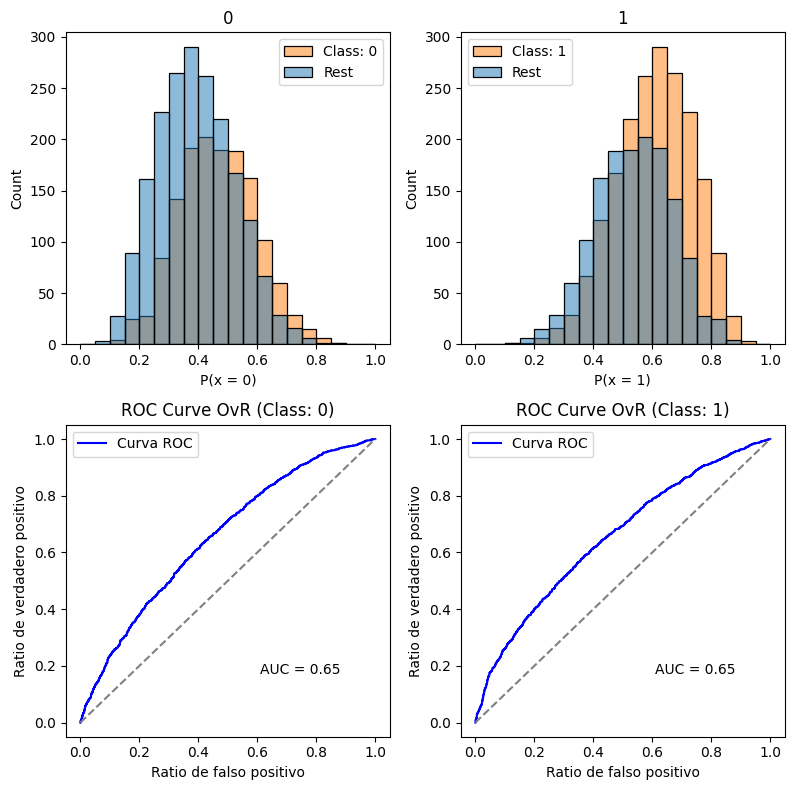

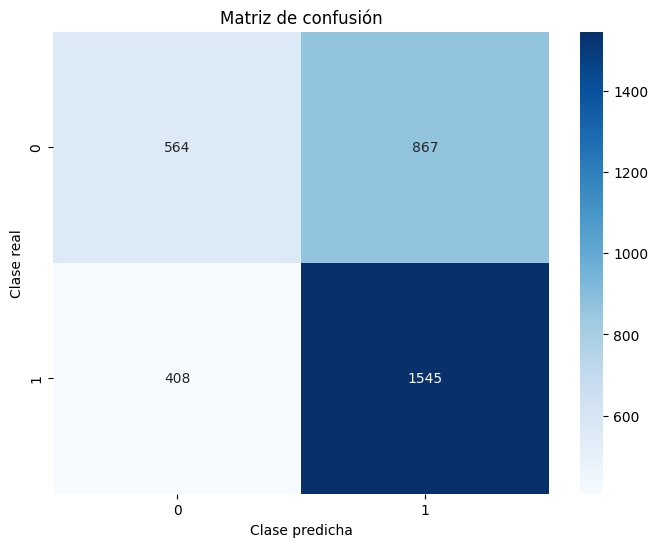

              precision    recall  f1-score   support

           0       0.58      0.39      0.47      1431
           1       0.64      0.79      0.71      1953

    accuracy                           0.62      3384
   macro avg       0.61      0.59      0.59      3384
weighted avg       0.62      0.62      0.61      3384



In [83]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_log.predict_proba(X_test), 
    model_multiclass=model_log, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="Log_10_filtered_FTr"
)

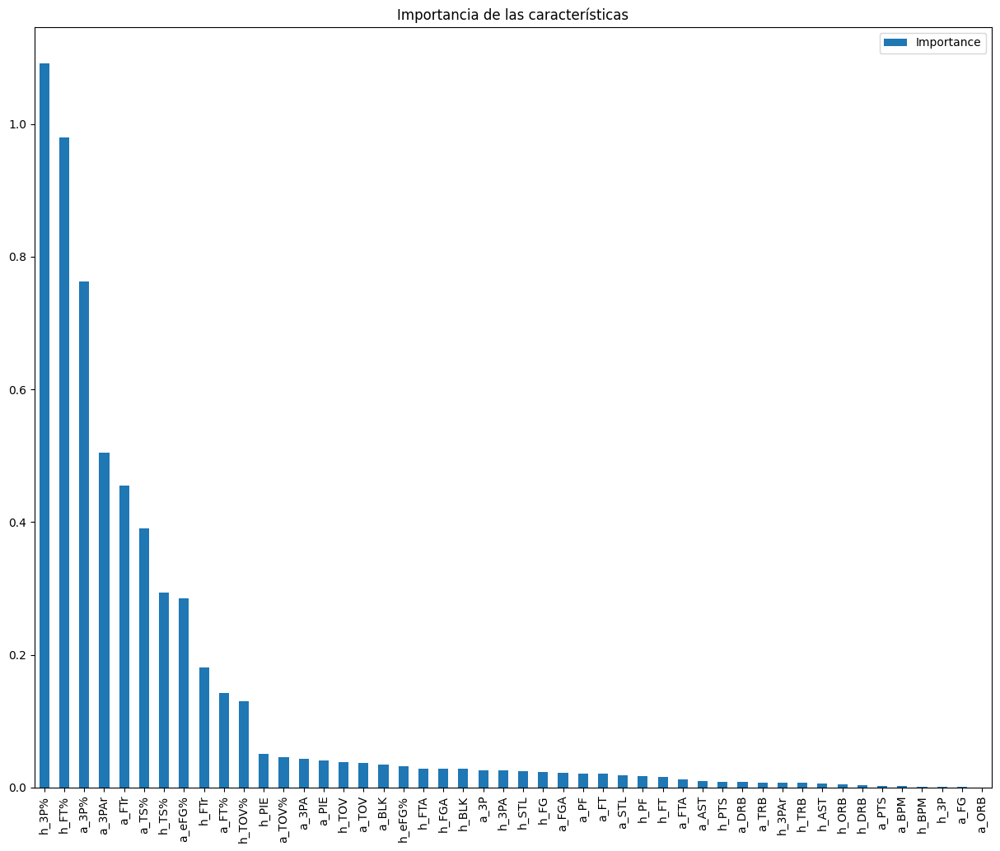

Ranking de variables:
1. Variable h_3P% (1.0916156217896498)
2. Variable h_FT% (0.9794782343049133)
3. Variable a_3P% (0.7626829717068716)
4. Variable a_3PAr (0.5045652908182588)
5. Variable a_FTr (0.45458770400760384)
6. Variable a_TS% (0.3898869337265691)
7. Variable h_TS% (0.29431029247102286)
8. Variable a_eFG% (0.2853914731988474)
9. Variable h_FTr (0.1802948566229985)
10. Variable a_FT% (0.14211794861794233)
11. Variable h_TOV% (0.1294483310473337)
12. Variable h_PIE (0.05025523216601873)
13. Variable a_TOV% (0.045448776075369055)
14. Variable a_3PA (0.04291309217778672)
15. Variable a_PIE (0.04120031014956707)
16. Variable h_TOV (0.03856654445127326)
17. Variable a_TOV (0.037266059372595105)
18. Variable a_BLK (0.03384477470574278)
19. Variable h_eFG% (0.03242769273775637)
20. Variable h_FTA (0.028399539324040806)
21. Variable h_FGA (0.027936184663104463)
22. Variable h_BLK (0.02782767397362102)
23. Variable a_3P (0.02554467315926912)
24. Variable h_3PA (0.02532969331100811)
25.

In [84]:
importancias_modelo(model_log, X_train)

In [85]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328


#### KNN (K-Nearest Neighbors)

In [86]:
X_train, X_test, y_train, y_test = train_test_split(player_full_10.drop(non_imput_columns, axis=1),
                                                    player_full_10.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = player_full_10.result)

In [88]:
model_knn = KNeighborsClassifier(n_jobs=-1)

In [92]:
grid_param = {
    'n_neighbors': list(range(1, 21)),
    'leaf_size': (20,40,1),
    'p': (1,2),
    'weights': ('uniform', 'distance'),
    'metric': ('minkowski', 'chebyshev'),
}

In [93]:
model_grid = GridSearchCV(estimator=model_knn,
                        param_grid=grid_param,
                        scoring='accuracy',
                        cv=3,
                        n_jobs=-3)

In [94]:
model_grid = model_grid.fit(X_train, y_train.values.ravel())

print(model_grid.best_score_)
print(model_grid.best_params_)
print(model_grid.cv_results_)

0.6036631762604475
{'leaf_size': 20, 'metric': 'minkowski', 'n_neighbors': 18, 'p': 1, 'weights': 'distance'}
{'mean_fit_time': array([0.0148979 , 0.01472783, 0.01155901, 0.00767485, 0.00886806,
       0.00852974, 0.00751424, 0.00818952, 0.0080146 , 0.00952888,
       0.00935117, 0.00870013, 0.00871197, 0.00919946, 0.00768201,
       0.0078512 , 0.00868646, 0.0081923 , 0.00818189, 0.00835466,
       0.00784683, 0.00869211, 0.0086805 , 0.00784938, 0.00851846,
       0.00801865, 0.00818666, 0.00768312, 0.00784413, 0.00734727,
       0.00852203, 0.00818547, 0.00801619, 0.00767907, 0.00861231,
       0.00912944, 0.00902017, 0.00969481, 0.00768828, 0.0076801 ,
       0.00801826, 0.00852688, 0.00834918, 0.00718021, 0.00834846,
       0.00868654, 0.00835117, 0.00834934, 0.00851878, 0.00835268,
       0.00852354, 0.00802239, 0.00818904, 0.00768042, 0.00801722,
       0.00751511, 0.00769758, 0.00785057, 0.0085214 , 0.00769385,
       0.0085156 , 0.00819119, 0.00801349, 0.00817839, 0.0075109 ,
 

In [95]:
model_knn = KNeighborsClassifier(n_neighbors=18,
                                 leaf_size=20,
                                    p=1,
                                    weights='distance',
                                    metric='minkowski',
                                    n_jobs=-1).fit(X_train, y_train)

y_pred = model_knn.predict(X_test)


Métricas globales:
Accuracy: 0.5900
Precision (weighted): 0.58
Recall (weighted): 0.59
F1-Score (weighted): 0.58

Matriz de confusión:
[[ 565  911]
 [ 522 1497]]
Accuracy: 0.5900


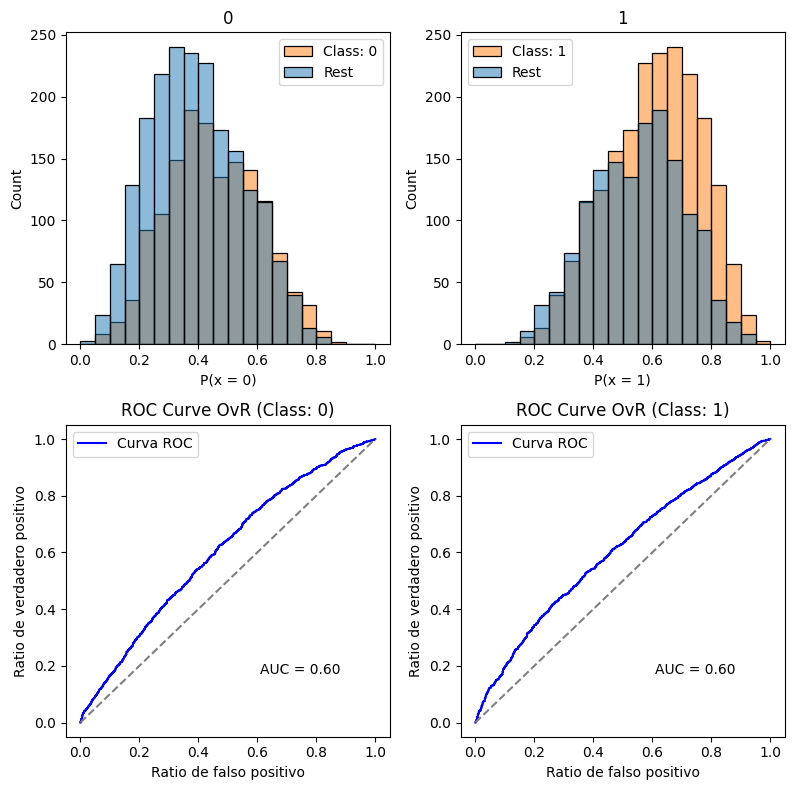

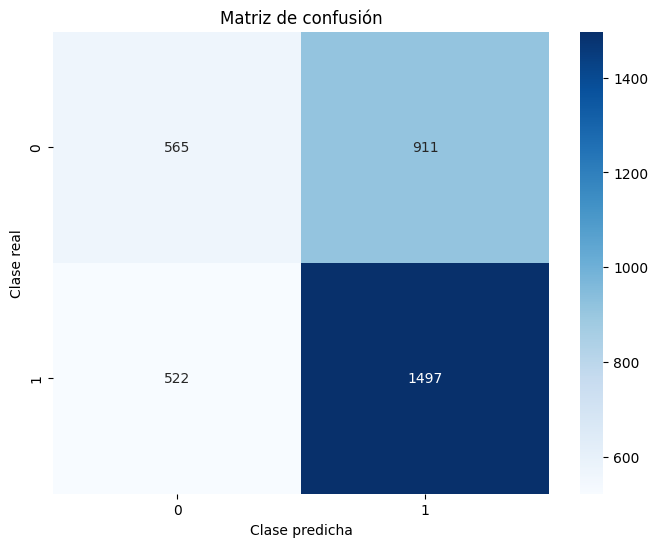

              precision    recall  f1-score   support

           0       0.52      0.38      0.44      1476
           1       0.62      0.74      0.68      2019

    accuracy                           0.59      3495
   macro avg       0.57      0.56      0.56      3495
weighted avg       0.58      0.59      0.58      3495



In [96]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_knn.predict_proba(X_test), 
    model_multiclass=model_knn, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="KNN_10_full"
)

Calculando importancia de características usando Permutation Importance...


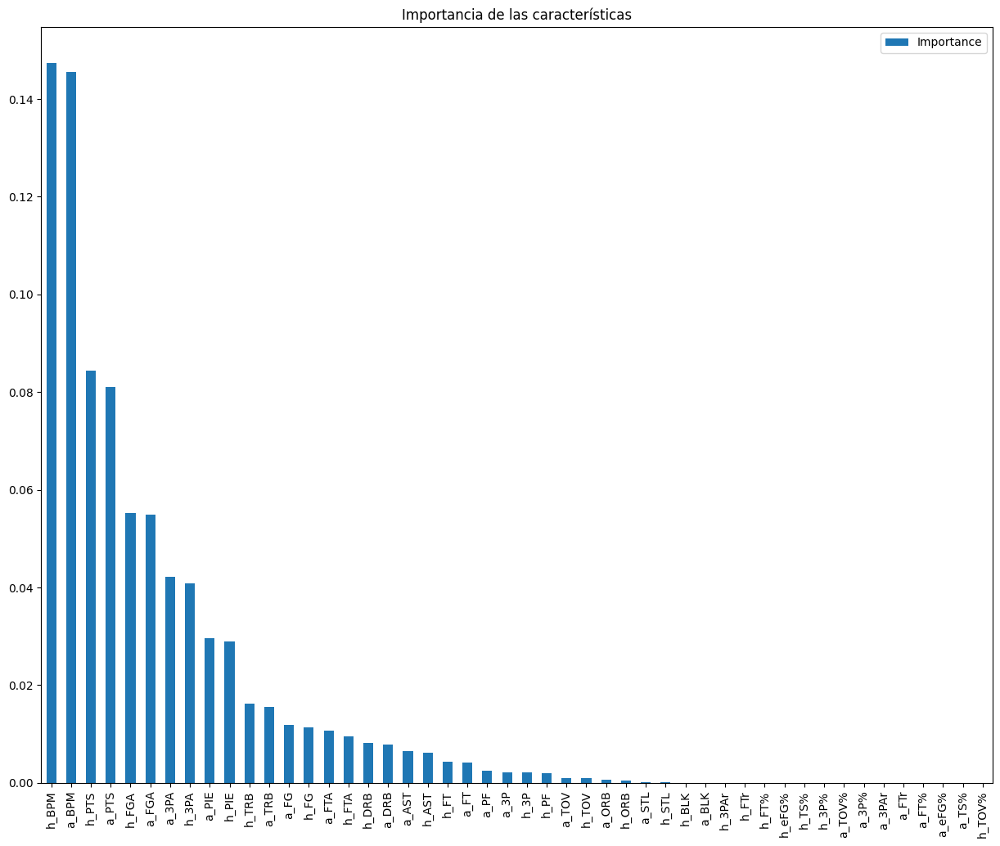

Ranking de variables:
1. Variable h_BPM (0.14741737015309772)
2. Variable a_BPM (0.14560022893117758)
3. Variable h_PTS (0.08436113893260838)
4. Variable a_PTS (0.0809700958649306)
5. Variable h_FGA (0.0553226498783803)
6. Variable a_FGA (0.054871941622549714)
7. Variable a_3PA (0.04225926455859208)
8. Variable h_3PA (0.04080698240091574)
9. Variable a_PIE (0.02954643010444985)
10. Variable h_PIE (0.02888825296895121)
11. Variable h_TRB (0.016275575904993567)
12. Variable a_TRB (0.015553011875804833)
13. Variable a_FG (0.011782801545285427)
14. Variable h_FG (0.011303476892259268)
15. Variable a_FTA (0.010723994849048523)
16. Variable h_FTA (0.009479181571040196)
17. Variable h_DRB (0.008105594505651747)
18. Variable a_DRB (0.007805122335098025)
19. Variable a_AST (0.006445843468307333)
20. Variable h_AST (0.00613821719845471)
21. Variable h_FT (0.004335384175132362)
22. Variable a_FT (0.0042066103877521745)
23. Variable a_PF (0.002425239662326506)
24. Variable a_3P (0.0021533838889683

In [103]:
importancias_modelo(model_knn, X_train, y_train=y_train)

In [104]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328
7,KNN_10_full,1.000000,0.589986,0.600659,0.008388


In [107]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PIE_BPM.result)

model_knn = KNeighborsClassifier(n_neighbors=18,
                                    leaf_size=20,
                                        p=1,
                                        weights='distance',
                                        metric='minkowski',
                                        n_jobs=-1).fit(X_train, y_train)

y_pred = model_knn.predict(X_test)


Métricas globales:
Accuracy: 0.5922
Precision (weighted): 0.58
Recall (weighted): 0.59
F1-Score (weighted): 0.58

Matriz de confusión:
[[ 532  835]
 [ 486 1386]]
Accuracy: 0.5922


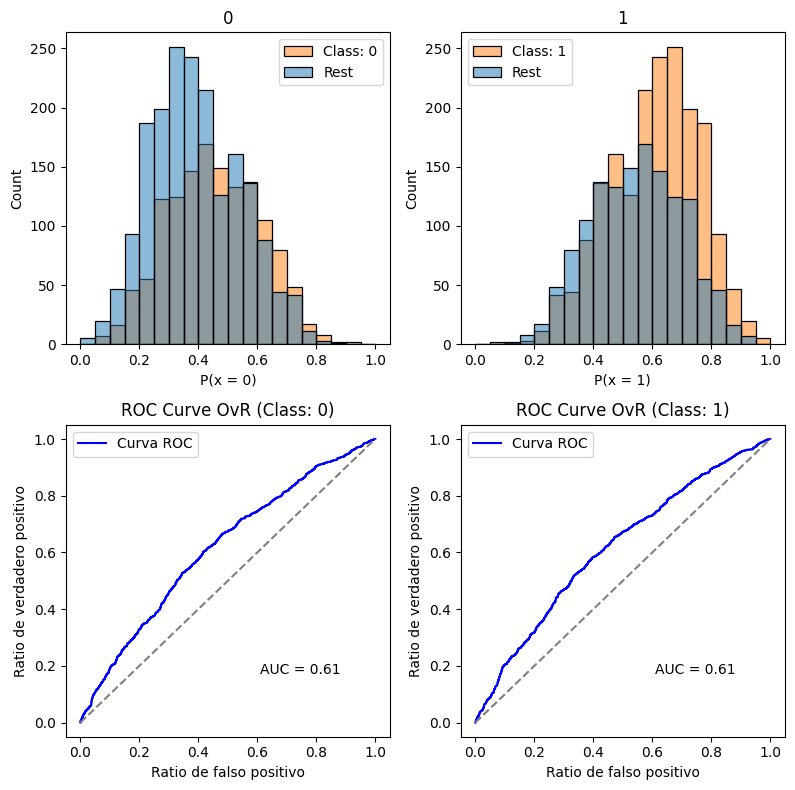

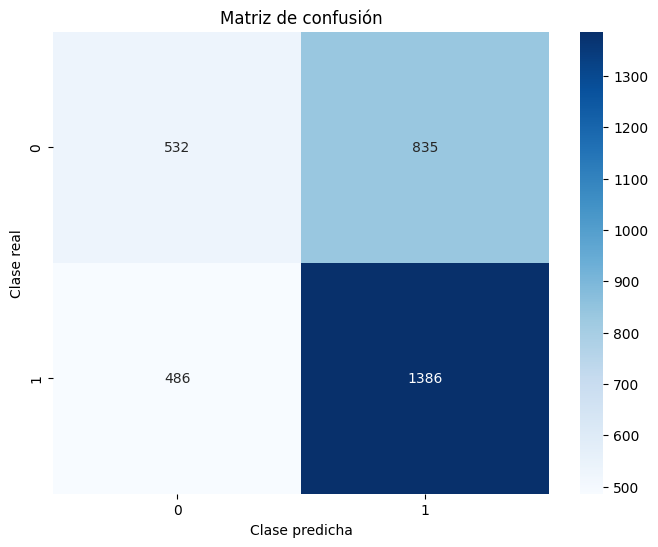

              precision    recall  f1-score   support

           0       0.52      0.39      0.45      1367
           1       0.62      0.74      0.68      1872

    accuracy                           0.59      3239
   macro avg       0.57      0.56      0.56      3239
weighted avg       0.58      0.59      0.58      3239



In [108]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_knn.predict_proba(X_test), 
    model_multiclass=model_knn, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="KNN_10_filtered_PIE_BPM"
)

In [109]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328
7,KNN_10_full,1.000000,0.589986,0.600659,0.008388
8,KNN_10_filtered_PIE_BPM,1.000000,0.592158,0.587264,0.004622


In [112]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PTS_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PTS_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PTS_PIE_BPM.result)

model_knn = KNeighborsClassifier(n_neighbors=18,
                                    leaf_size=20,
                                        p=1,
                                        weights='distance',
                                        metric='minkowski',
                                        n_jobs=-1).fit(X_train, y_train)

y_pred = model_knn.predict(X_test)


Métricas globales:
Accuracy: 0.5864
Precision (weighted): 0.57
Recall (weighted): 0.59
F1-Score (weighted): 0.57

Matriz de confusión:
[[ 496  829]
 [ 469 1344]]
Accuracy: 0.5864


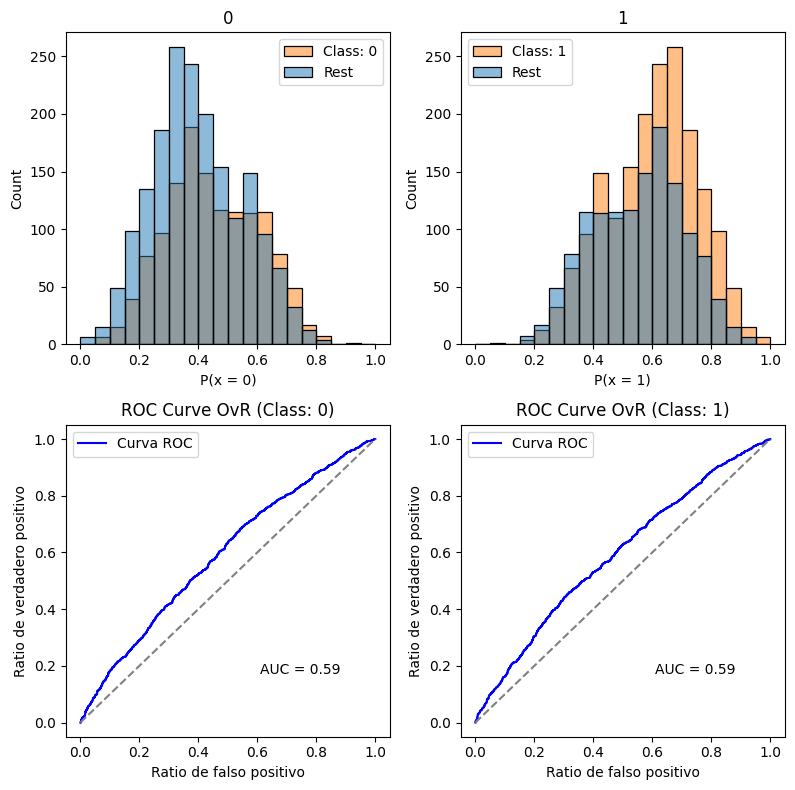

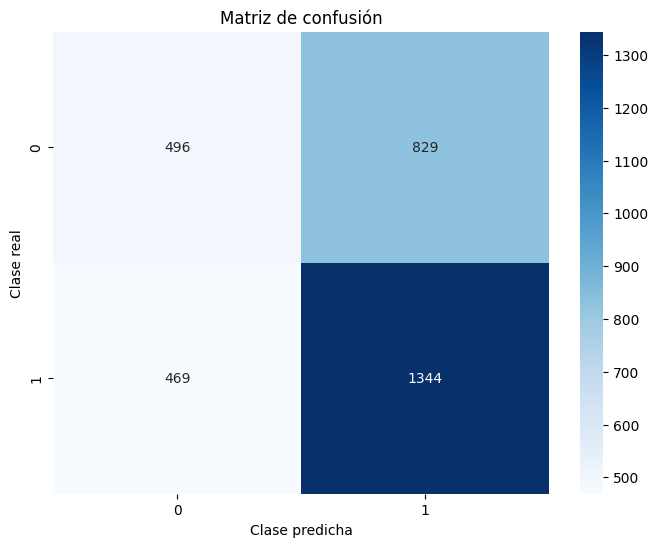

              precision    recall  f1-score   support

           0       0.51      0.37      0.43      1325
           1       0.62      0.74      0.67      1813

    accuracy                           0.59      3138
   macro avg       0.57      0.56      0.55      3138
weighted avg       0.57      0.59      0.57      3138



In [113]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_knn.predict_proba(X_test), 
    model_multiclass=model_knn, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="KNN_10_filtered_PTS_PIE_BPM"
)

In [114]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328
7,KNN_10_full,1.000000,0.589986,0.600659,0.008388
8,KNN_10_filtered_PIE_BPM,1.000000,0.592158,0.587264,0.004622
9,KNN_10_filtered_PTS_PIE_BPM,1.000000,0.586361,0.596925,0.008912


#### GNB (Naive-Bayes)

In [115]:
X_train, X_test, y_train, y_test = train_test_split(player_full_10.drop(non_imput_columns, axis=1),
                                                    player_full_10.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = player_full_10.result)

In [120]:
model_gnb = GaussianNB()

In [121]:
grid_param = {
    'var_smoothing': np.logspace(-9, 0, 100)
}

In [122]:
model_grid = GridSearchCV(estimator=model_gnb,
                        param_grid=grid_param,
                        scoring='accuracy',
                        cv=3,
                        n_jobs=12)

In [123]:
model_grid = model_grid.fit(X_train, y_train.values.ravel())

print(model_grid.best_score_)
print(model_grid.best_params_)
print(model_grid.cv_results_)

0.5997283550750605
{'var_smoothing': 2.848035868435805e-07}
{'mean_fit_time': array([0.02203441, 0.02470414, 0.02321506, 0.02124715, 0.02021114,
       0.02095135, 0.02194842, 0.02039194, 0.01974074, 0.02038598,
       0.02263625, 0.01971944, 0.02277231, 0.02206079, 0.02253723,
       0.0188988 , 0.02140236, 0.02160096, 0.0207444 , 0.0232176 ,
       0.02605319, 0.02539261, 0.0247283 , 0.02386721, 0.02289629,
       0.02245688, 0.02119716, 0.02190598, 0.02245291, 0.02510715,
       0.02388668, 0.02310363, 0.02521984, 0.02712806, 0.02354026,
       0.02070729, 0.02235961, 0.02202296, 0.02286243, 0.02188913,
       0.02171032, 0.02523152, 0.02506804, 0.0241859 , 0.0254058 ,
       0.0272367 , 0.02305659, 0.01971515, 0.02471582, 0.0245533 ,
       0.02120701, 0.0241065 , 0.02205857, 0.02271159, 0.02573888,
       0.02587382, 0.02521094, 0.02621698, 0.02154422, 0.02404992,
       0.02354463, 0.02438434, 0.02739509, 0.02405548, 0.02288437,
       0.02406279, 0.02638793, 0.02656412, 0.029902

In [124]:
model_gnb = GaussianNB(var_smoothing=2.848035868435805e-07).fit(X_train, y_train)

In [125]:
y_pred = model_gnb.predict(X_test)


Métricas globales:
Accuracy: 0.6000
Precision (weighted): 0.60
Recall (weighted): 0.60
F1-Score (weighted): 0.60

Matriz de confusión:
[[ 701  775]
 [ 623 1396]]
Accuracy: 0.6000


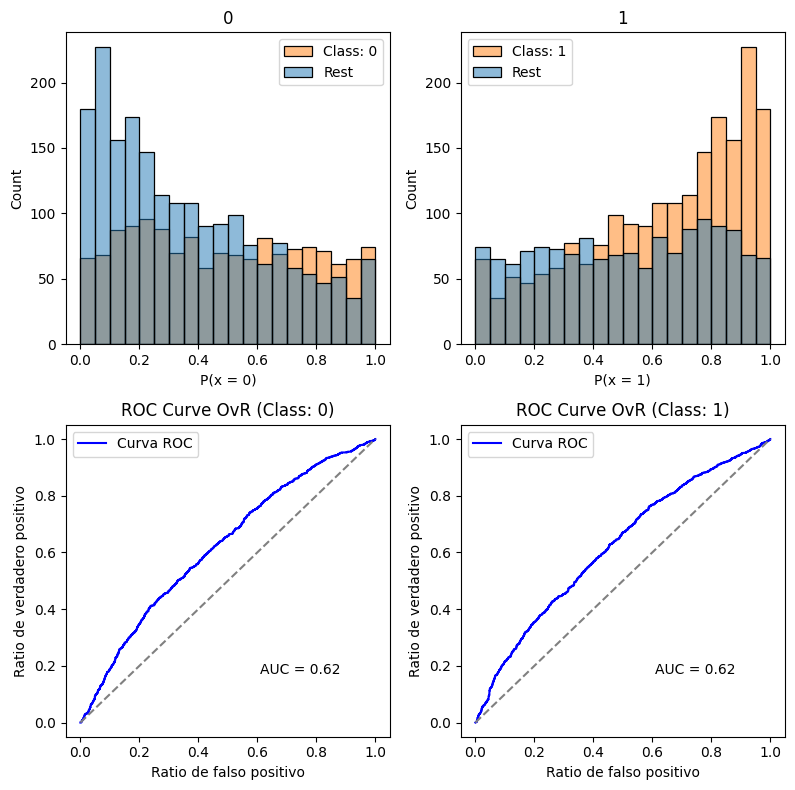

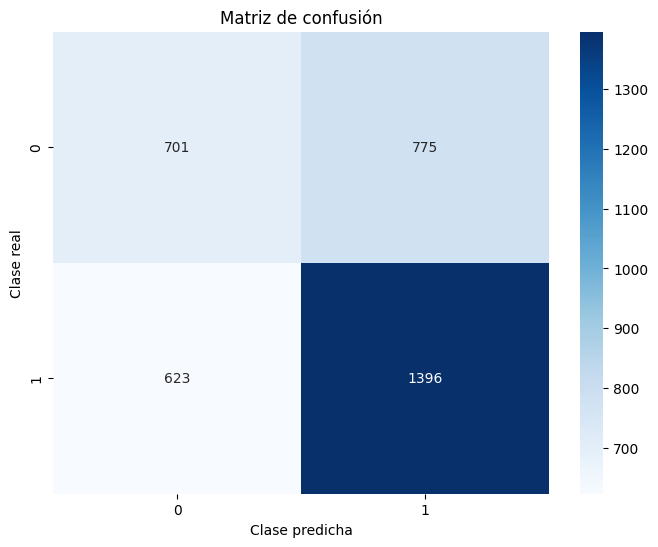

              precision    recall  f1-score   support

           0       0.53      0.47      0.50      1476
           1       0.64      0.69      0.67      2019

    accuracy                           0.60      3495
   macro avg       0.59      0.58      0.58      3495
weighted avg       0.60      0.60      0.60      3495



In [126]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_gnb.predict_proba(X_test), 
    model_multiclass=model_gnb, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="GNB_10_full"
)

Calculando importancia de características usando Permutation Importance...


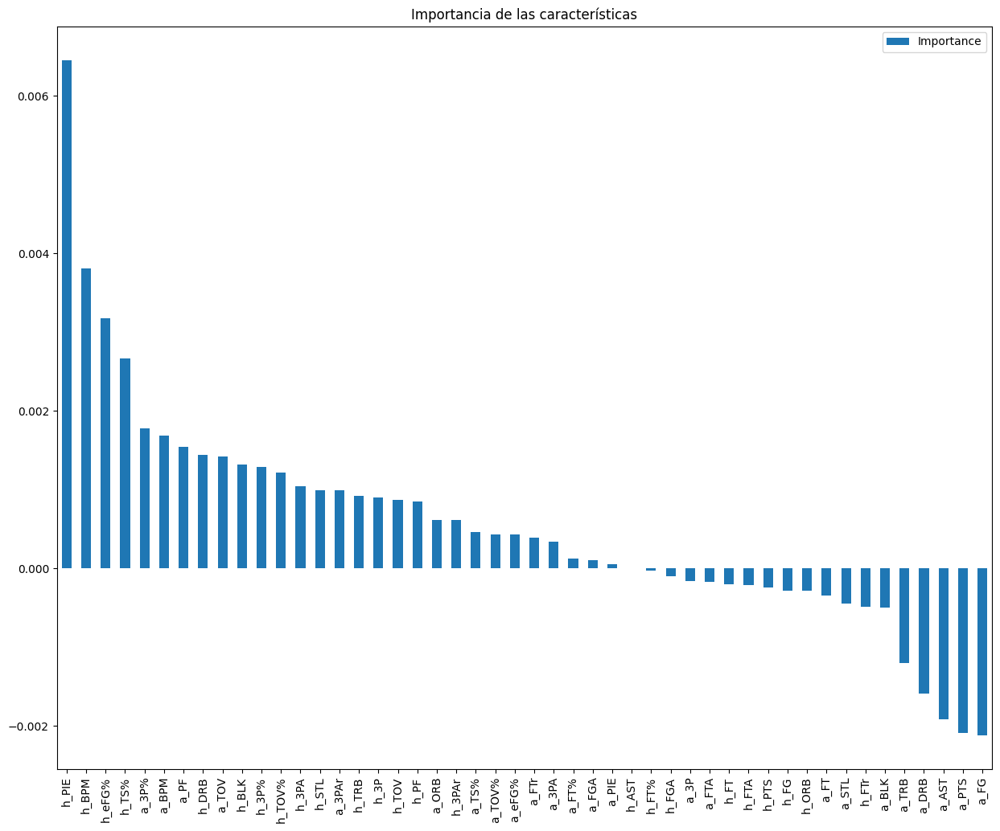

Ranking de variables:
1. Variable h_PIE (0.006452997567606267)
2. Variable h_BPM (0.0038059808270139326)
3. Variable h_eFG% (0.003176420088710885)
4. Variable h_TS% (0.0026613249391901793)
5. Variable a_3P% (0.0017742166261268011)
6. Variable a_BPM (0.001688367434540017)
7. Variable a_PF (0.0015452854485620727)
8. Variable h_DRB (0.0014451280583775094)
9. Variable a_TOV (0.0014165116611818851)
10. Variable h_BLK (0.0013163542709973219)
11. Variable h_3P% (0.0012877378738017197)
12. Variable h_TOV% (0.0012161968808127588)
13. Variable h_3PA (0.001044498497639168)
14. Variable h_STL (0.0009872657032479859)
15. Variable a_3PAr (0.0009872657032479859)
16. Variable h_TRB (0.0009157247102590249)
17. Variable h_3P (0.0009014165116612239)
18. Variable h_TOV (0.0008728001144655995)
19. Variable h_PF (0.0008441837172700195)
20. Variable a_ORB (0.0006152525397053133)
21. Variable h_3PAr (0.000615252539705291)
22. Variable a_TS% (0.00045786235512952357)
23. Variable a_TOV% (0.0004292459579339436)


In [127]:
importancias_modelo(model_gnb, X_train, y_train=y_train)

In [128]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328
7,KNN_10_full,1.000000,0.589986,0.600659,0.008388
8,KNN_10_filtered_PIE_BPM,1.000000,0.592158,0.587264,0.004622
9,KNN_10_filtered_PTS_PIE_BPM,1.000000,0.586361,0.596925,0.008912


In [130]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PIE_BPM.result)

model_gnb = GaussianNB(var_smoothing=2.848035868435805e-07).fit(X_train, y_train)

y_pred = model_gnb.predict(X_test)


Métricas globales:
Accuracy: 0.6073
Precision (weighted): 0.60
Recall (weighted): 0.61
F1-Score (weighted): 0.61

Matriz de confusión:
[[ 699  668]
 [ 604 1268]]
Accuracy: 0.6073


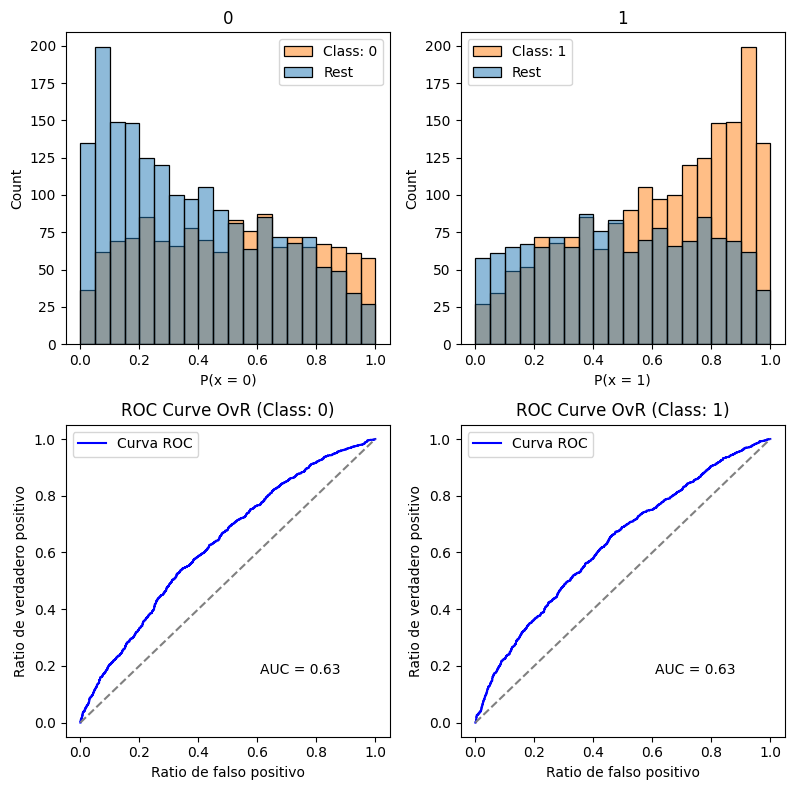

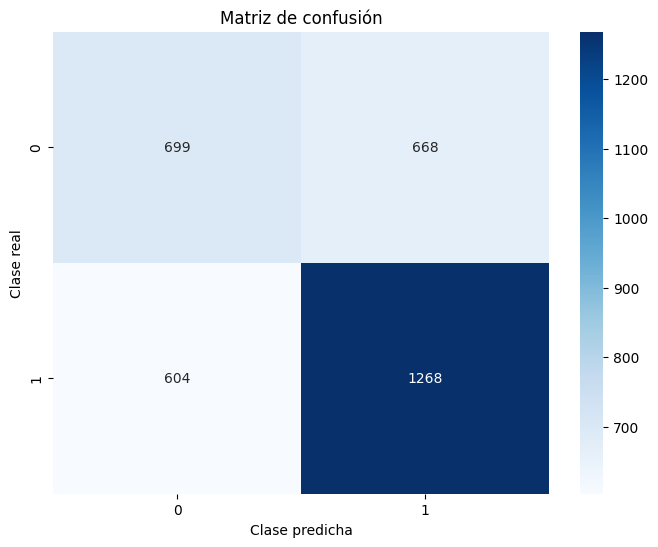

              precision    recall  f1-score   support

           0       0.54      0.51      0.52      1367
           1       0.65      0.68      0.67      1872

    accuracy                           0.61      3239
   macro avg       0.60      0.59      0.59      3239
weighted avg       0.60      0.61      0.61      3239



In [131]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_gnb.predict_proba(X_test), 
    model_multiclass=model_gnb, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="GNB_10_filtered_PIE_BPM"
)

Calculando importancia de características usando Permutation Importance...


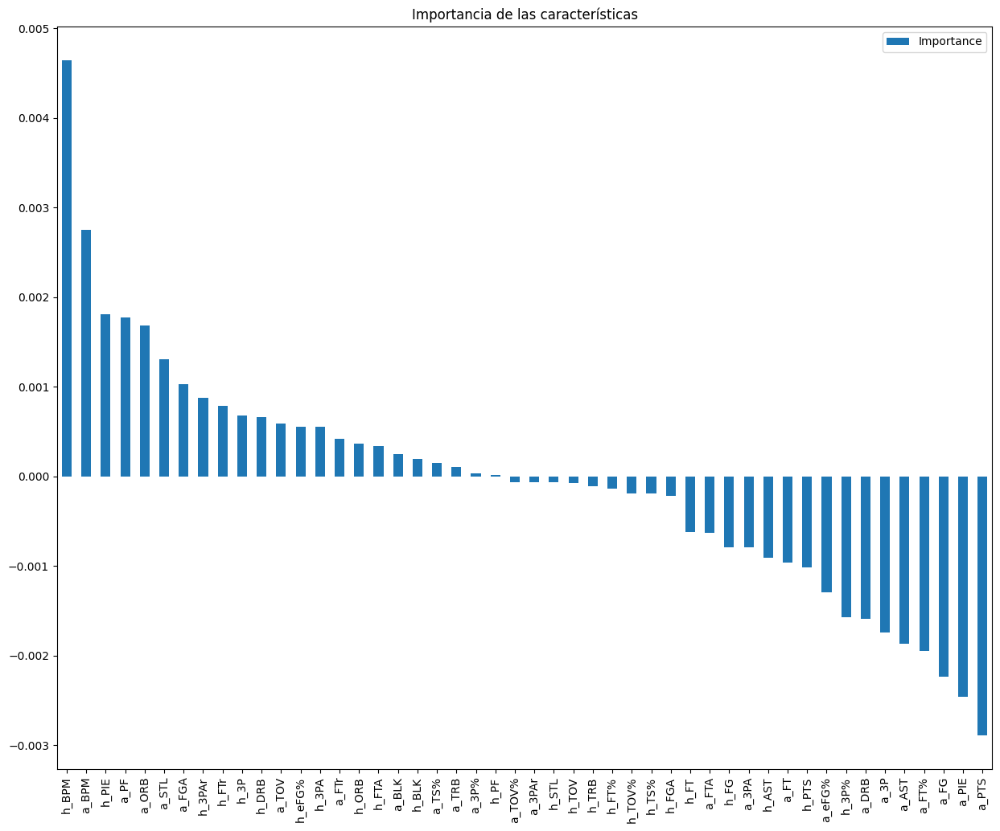

Ranking de variables:
1. Variable h_BPM (0.004646854496333508)
2. Variable a_BPM (0.002747973755306865)
3. Variable h_PIE (0.0018062524121961188)
4. Variable a_PF (0.0017753763025859294)
5. Variable a_ORB (0.0016827479737553386)
6. Variable a_STL (0.001312234658433087)
7. Variable a_FGA (0.0010343496719413814)
8. Variable h_3PAr (0.0008799691238904339)
9. Variable h_FTr (0.0007873407950598876)
10. Variable h_3P (0.0006792744114242133)
11. Variable h_DRB (0.0006638363566191074)
12. Variable a_TOV (0.0005866460825936226)
13. Variable h_eFG% (0.0005557699729834331)
14. Variable h_3PA (0.0005557699729834331)
15. Variable a_FTr (0.00041682747973756926)
16. Variable h_ORB (0.00037051331532229615)
17. Variable h_FTA (0.00033963720571210664)
18. Variable a_BLK (0.00024700887688156037)
19. Variable h_BLK (0.00020069471246628723)
20. Variable a_TS% (0.00015438054805099187)
21. Variable a_TRB (0.00010806638363567434)
22. Variable a_3P% (3.08761096102339e-05)
23. Variable h_PF (1.543805480510585e-

In [132]:
importancias_modelo(model_gnb, X_train, y_train=y_train)

In [133]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328
7,KNN_10_full,1.000000,0.589986,0.600659,0.008388
8,KNN_10_filtered_PIE_BPM,1.000000,0.592158,0.587264,0.004622
9,KNN_10_filtered_PTS_PIE_BPM,1.000000,0.586361,0.596925,0.008912



Métricas globales:
Accuracy: 0.5921
Precision (weighted): 0.59
Recall (weighted): 0.59
F1-Score (weighted): 0.59

Matriz de confusión:
[[ 629  696]
 [ 584 1229]]
Accuracy: 0.5921


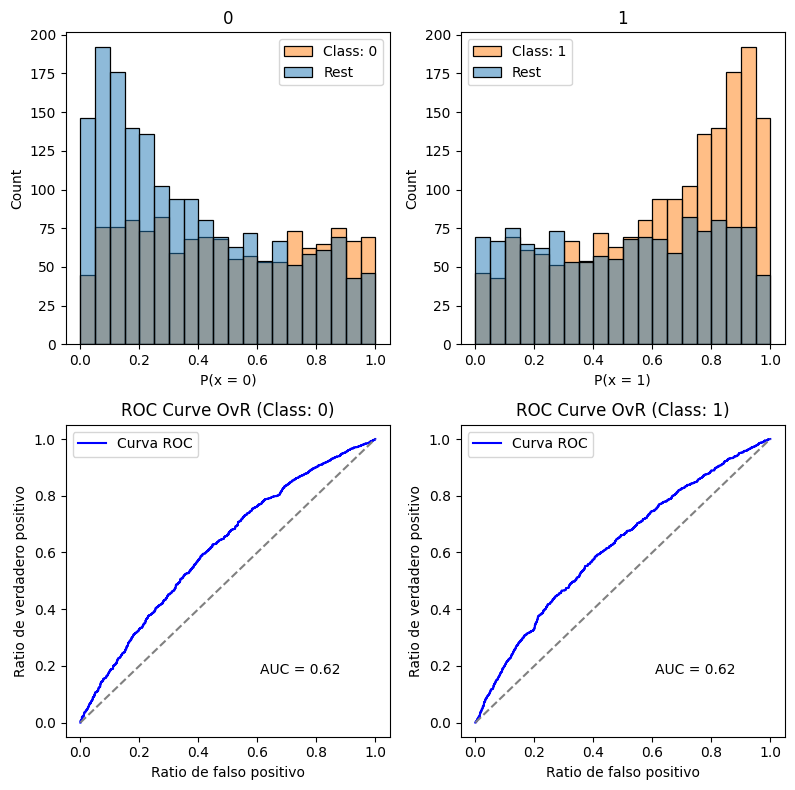

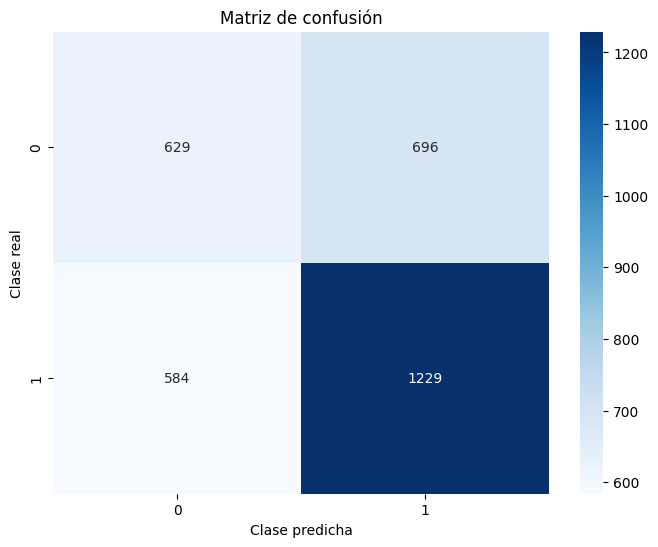

              precision    recall  f1-score   support

           0       0.52      0.47      0.50      1325
           1       0.64      0.68      0.66      1813

    accuracy                           0.59      3138
   macro avg       0.58      0.58      0.58      3138
weighted avg       0.59      0.59      0.59      3138



In [135]:
X_train, X_test, y_train, y_test = train_test_split(filtered_player_full_10_PTS_PIE_BPM.drop(non_imput_columns, axis=1),
                                                    filtered_player_full_10_PTS_PIE_BPM.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = filtered_player_full_10_PTS_PIE_BPM.result)

model_gnb = GaussianNB(var_smoothing=2.848035868435805e-07).fit(X_train, y_train)

y_pred = model_gnb.predict(X_test)

metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_gnb.predict_proba(X_test), 
    model_multiclass=model_gnb, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="GNB_10_filtered_PTS_PIE_BPM"
)

In [136]:
results_df

,model_name,Train Score,Test Score,CV Score,CV Score Std
0,RF_10_full,0.998641,0.617740,0.622048,0.003912
1,RF_10_filtered_PIE_BPM,0.999846,0.620871,0.615901,0.004556
2,RF_10_filtered_PTS_BPM_PIE,0.999203,0.612173,0.624094,0.007214
3,Log_10_full,0.629352,0.616953,0.624652,0.008098
4,Log_10_filtered_PIE_BPM,0.631339,0.614078,0.626476,0.004704
5,Log_10_filtered_PTS_PIE_BPM,0.629352,0.616953,0.624652,0.008098
6,Log_10_filtered_FTr,0.624631,0.623227,0.622488,0.009328
7,KNN_10_full,1.000000,0.589986,0.600659,0.008388
8,KNN_10_filtered_PIE_BPM,1.000000,0.592158,0.587264,0.004622
9,KNN_10_filtered_PTS_PIE_BPM,1.000000,0.586361,0.596925,0.008912


#### SVC

In [8]:
X_train, X_test, y_train, y_test = train_test_split(player_full_10.drop(non_imput_columns, axis=1),
                                                    player_full_10.result,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify = player_full_10.result)

model_svc = SVC(random_state=42,
                probability=True)

In [138]:
# grid_param = {
#     'C': [100],
#     'kernel': ['linear'],
#     'degree': [1, 3, 5, 7],
#     'gamma': ['scale', 'auto']
# }

In [18]:
grid_param = {
    'C': [100],
    'kernel': ['linear'],
    'degree': [3],
    'gamma': ['scale']
}

In [19]:
model_grid = GridSearchCV(estimator=model_svm,
                        param_grid=grid_param,
                        scoring='accuracy',
                        cv=3,
                        n_jobs=12)

In [17]:
model_grid = model_grid.fit(X_train, y_train.values.ravel())

print(model_grid.best_score_)
print(model_grid.best_params_)
print(model_grid.cv_results_)

KeyboardInterrupt: 

In [20]:
model_svc = SVC(C=100,
                kernel='linear',
                degree=3,
                gamma='scale',
                random_state=42,
                probability=True).fit(X_train, y_train)

In [21]:
y_pred = model_svc.predict(X_test)


Métricas globales:
Accuracy: 0.6203
Precision (weighted): 0.61
Recall (weighted): 0.62
F1-Score (weighted): 0.60

Matriz de confusión:
[[ 554  922]
 [ 405 1614]]
Accuracy: 0.6203


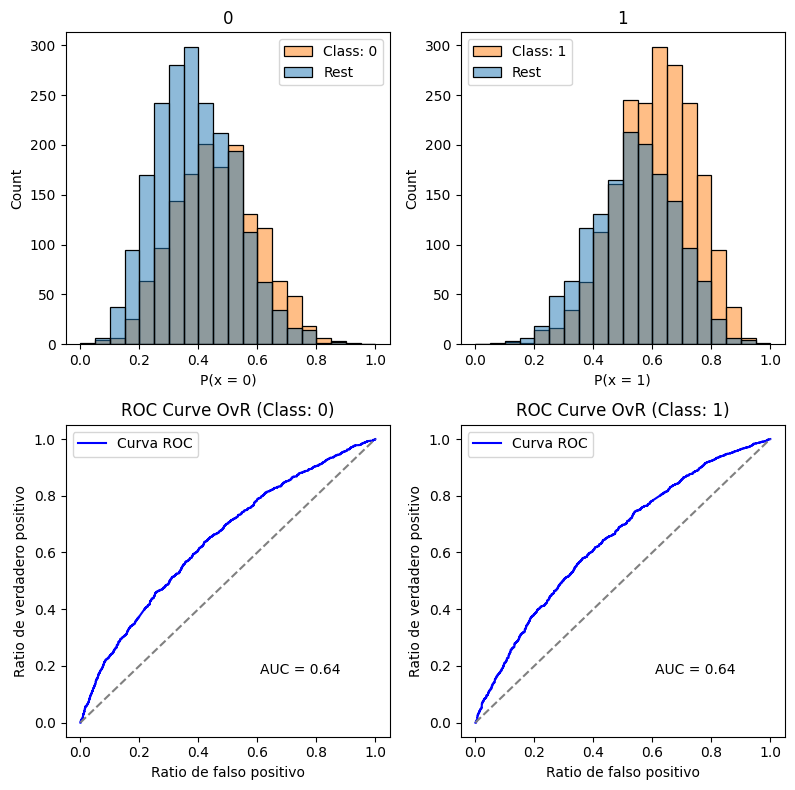

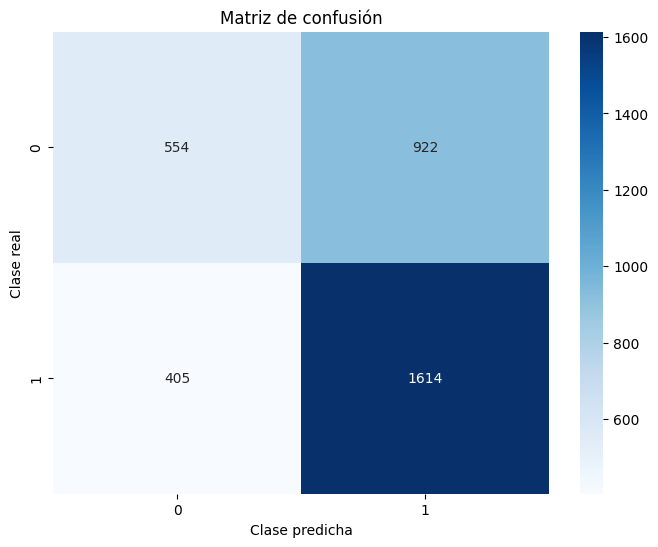

              precision    recall  f1-score   support

           0       0.58      0.38      0.46      1476
           1       0.64      0.80      0.71      2019

    accuracy                           0.62      3495
   macro avg       0.61      0.59      0.58      3495
weighted avg       0.61      0.62      0.60      3495



In [ ]:
metricas_modelo(
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    y_test=y_test, 
    y_pred=y_pred, 
    y_proba = model_svc.predict_proba(X_test), 
    model_multiclass=model_svc, 
    get_all_roc_coordinates=get_all_roc_coordinates, 
    plot_roc_curve=plot_roc_curve, 
    results_df=results_df, 
    name_model="SVC_10_full"
)

In [ ]:
importancias_modelo(model_svc, X_train, y_train=y_train)

In [ ]:
results_df